In [195]:
import numpy as np
import os
import pandas as pd
from arcpy import env
from arcpy import TableToTable_conversion
import matplotlib.ticker as mtick

In [196]:
dirWork = os.getcwd()
dirData = os.path.join(dirWork, r'data')
dirCCS  = os.path.join(dirData, r'udot-ccs')
dirProcessed = os.path.join(dirWork, r'data-processed\ccs')
dirResults = os.path.join(dirWork, r'data-processed\factors')

print("Working Directory: " + dirWork)
print("Data Directory: " + dirData)
print("CCS Directory: " + dirCCS)

Working Directory: E:\GitHub\V-over-C-Calculations
Data Directory: E:\GitHub\V-over-C-Calculations\data
CCS Directory: E:\GitHub\V-over-C-Calculations\data\udot-ccs


# Run Settings

In [197]:
#set to true for first time to create CSVs, false to speed up for subsequent times
process_HrVoldbftocsv = False

#set filenames for CCS data
dbf_HrVol_Lane = os.path.join(dirCCS,  r'tblHourlyVolumes.dbf')
csv_HrVol_Lane = os.path.join(dirProcessed, r'CCS_HourlyVolumes.csv')

# Convert DBFs to CSVs

In [198]:
# Create function that converts dbfs to csvs using arcpy
def dbfToCSV(dbf, csv):
    TableToTable_conversion(dbf, os.path.dirname(csv), os.path.basename(csv))

# Allow arcpy to overwrite output files
env.overwriteOutput = True

# convert dbfs to csvs
if process_HrVoldbftocsv:
    print("CCS DBF converting to CSV.")
    dbfToCSV(dbf_HrVol_Lane, csv_HrVol_Lane)
    print("CCS done.")
else:
    print("Don't convert CCS DBF.")

print('Done')
        

Don't convert CCS DBF.
Done


# Continuous Count Station (CCS) Data

In [199]:
df_SeasonSiteGroups = pd.read_csv(os.path.join(dirCCS, r'SeasonSiteGroups.csv'))
df_SeasonSiteGroups

,SiteGroupSeason,SsnGrp,SsnATGroup,SsnVolCls
0,SN0,AlpineLoop,0-AllAreaTypes,0-AllVolumes
1,SN1,BearLake,0-AllAreaTypes,0-AllVolumes
2,SN2,BigCottonwood,0-AllAreaTypes,0-AllVolumes
3,SN3,CedarBreaks,0-AllAreaTypes,0-AllVolumes
4,SN4,FreewayI15,1-Rural,0-AllVolumes
5,SN5,FreewayI15,2-Transition,0-AllVolumes
6,SN6,FreewayI15,3-Suburban,0-AllVolumes
7,SN7,FreewayI15,4-Urban,0-AllVolumes
8,XX1,FreewayI15,5-CBD,0-AllVolumes
9,SN8,FreewayI215,0-AllAreaTypes,0-AllVolumes


In [200]:
df_Sites_bySiteGroup = pd.read_json(os.path.join(dirCCS,  r'sitegroups_ccs.json'))
df_Sites_bySiteGroup = df_Sites_bySiteGroup.rename(columns={"SiteGroup": "SiteGroupSeason"})
df_Sites_bySiteGroup

,SiteGroupSeason,SiteID,SiteName
0,SN0,601,601: SR 92 American Fork Canyon W Toll Booth M...
1,SN0,602,602: SR 92 American Fork Canyon E Toll Booth M...
2,SN1,304,"304: SR 89 0.6 mile N of SR 30, Garden City MP..."
3,SN1,362,"362: SR 89 0.2 mile W of SR 30, Garden City MP..."
4,SN2,322,322: SR 190 Mouth of Big Cottonwood Cyn. MP 2....
...,...,...,...
336,WDH,614,614: I 84 3.2 miles W of Bothwell Int. MP 36.6...
337,WDI,624,624: SR 67 Legacy Parkway MP 0.944 FC 12
338,WDI,625,625: SR 67 Legacy Parkway MP 11.418 FC 12
339,WDJ,619,"619: SR 201 6174 W, SLC MP 10.600 FC 12"


In [201]:
#only show season site groups
df_Sites_bySeasonSiteGroup = df_Sites_bySiteGroup[df_Sites_bySiteGroup['SiteGroupSeason'].str.contains("SN")] 

pd.set_option('display.max_rows', df_Sites_bySeasonSiteGroup.shape[0]+1)

df_Sites_bySeasonSiteGroup

,SiteGroupSeason,SiteID,SiteName
0,SN0,601,601: SR 92 American Fork Canyon W Toll Booth M...
1,SN0,602,602: SR 92 American Fork Canyon E Toll Booth M...
2,SN1,304,"304: SR 89 0.6 mile N of SR 30, Garden City MP..."
3,SN1,362,"362: SR 89 0.2 mile W of SR 30, Garden City MP..."
4,SN2,322,322: SR 190 Mouth of Big Cottonwood Cyn. MP 2....
5,SN3,382,"382: SR 14 1.7 miles E of SR 130, Cedar City M..."
6,SN4,310,310: I 15 3 miles S of Plymouth Int. MP 389.34...
7,SN4,313,313: I 15 1 mile S of Scipio Int. MP 187.083 F...
8,SN4,349,349: I 15 2 miles N of Santaquin Int. MP 246.9...
9,SN4,502,502: I 15 0.5 mile S of Nephi Int. MP 222.158 ...


## Import and Process Data

In [202]:
df_HrVol_Lane = pd.read_csv(csv_HrVol_Lane)

#Remove where exclude is 0
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.Exclude == 0]

#Remove where holiday is 0
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.Holiday == 0]

#Remove where holiday not 2018
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.intYear != 2018]

df_HrVol_Lane

,OID_,SiteID,Direction,intYear,bytMonth,bytDay,bytLane,bytHour,Volume,DOW,Holiday,Exclude
24,NaN,301,N,2013,1,2,0,0,133,4,0,0
25,NaN,301,N,2013,1,2,0,1,112,4,0,0
26,NaN,301,N,2013,1,2,0,2,59,4,0,0
27,NaN,301,N,2013,1,2,0,3,66,4,0,0
28,NaN,301,N,2013,1,2,0,4,132,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9080369,NaN,714,P,2017,12,31,0,19,34,1,0,0
9080370,NaN,714,P,2017,12,31,0,20,23,1,0,0
9080371,NaN,714,P,2017,12,31,0,21,32,1,0,0
9080372,NaN,714,P,2017,12,31,0,22,30,1,0,0


In [203]:
df_HrVol = df_HrVol_Lane.groupby(['SiteID','Direction','intYear','bytMonth','bytDay','bytHour','Volume','DOW']).agg({'bytLane': [np.size]})

df_HrVol.reset_index(level=df_HrVol.index.names, inplace=True)

df_HrVol.columns = df_HrVol.columns.droplevel(1)

df_HrVol = df_HrVol.rename(columns={('bytLane'):'numLanes'})

df_HrVol

,SiteID,Direction,intYear,bytMonth,bytDay,bytHour,Volume,DOW,numLanes
0,301,N,2013,1,2,0,133,4,1
1,301,N,2013,1,2,1,112,4,1
2,301,N,2013,1,2,2,59,4,1
3,301,N,2013,1,2,3,66,4,1
4,301,N,2013,1,2,4,132,4,1
...,...,...,...,...,...,...,...,...,...
8719789,714,P,2017,12,31,19,34,1,1
8719790,714,P,2017,12,31,20,23,1,1
8719791,714,P,2017,12,31,21,32,1,1
8719792,714,P,2017,12,31,22,30,1,1


In [204]:
df_DyVol = df_HrVol.groupby(['SiteID','Direction','intYear','bytMonth','bytDay','DOW']).agg({'Volume': [np.sum, np.size]})
df_DyVol

Volume     
                                                sum size
SiteID Direction intYear bytMonth bytDay DOW            
301    N         2013    1        2      4    23874   24
                                  3      5    23721   24
                                  4      6    25482   24
                                  5      7    23810   24
                                  6      1    18814   24
...                                             ...  ...
714    P         2017    12       27     4     1303   24
                                  28     5     1330   24
                                  29     6     1342   24
                                  30     7     1158   24
                                  31     1      851   24

[363327 rows x 2 columns]

In [205]:
df_DyVol.groupby(['SiteID','Direction','intYear']).agg({('Volume','sum'): [np.mean, np.size]})

Volume     
                                   sum     
                                  mean size
SiteID Direction intYear                   
301    N         2013     23860.736686  338
                 2014     25303.962099  343
                 2015     27054.488439  346
                 2016     28179.628571  350
                 2017     28415.233236  343
...                                ...  ...
714    N         2016       870.185185  351
                 2017      1160.034582  347
       P         2015       638.965714  350
                 2016       876.504274  351
                 2017      1153.985591  347

[1076 rows x 2 columns]

In [206]:
df_DyVol.groupby(['intYear']).agg({('Volume','sum'): [np.mean]})

,Volume
,sum
,mean
intYear,
2013,13340.652635
2014,15119.088750
2015,15372.928158
2016,16402.884376
2017,17432.316665


In [207]:
dHourPeriod = {
     'Hour'    : [   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23],
     'Period'  : ['EV','EV','EV','EV','EV','EV','AM','AM','AM','MD','MD','MD','MD','MD','MD','PM','PM','PM','EV','EV','EV','EV','EV','EV']
}

df_HourPeriod = pd.DataFrame(dHourPeriod)
df_HourPeriod

,Hour,Period
0,0,EV
1,1,EV
2,2,EV
3,3,EV
4,4,EV
5,5,EV
6,6,AM
7,7,AM
8,8,AM
9,9,MD


In [208]:
df_HrVol_wPeriod = pd.DataFrame.merge(df_HrVol, df_HourPeriod, left_on='bytHour', right_on='Hour', how='inner')
df_HrVol_wPeriod

,SiteID,Direction,intYear,bytMonth,bytDay,bytHour,Volume,DOW,numLanes,Hour,Period
0,301,N,2013,1,2,0,133,4,1,0,EV
1,301,N,2013,1,3,0,189,5,1,0,EV
2,301,N,2013,1,4,0,204,6,1,0,EV
3,301,N,2013,1,5,0,263,7,1,0,EV
4,301,N,2013,1,6,0,254,1,1,0,EV
...,...,...,...,...,...,...,...,...,...,...,...
8719789,714,P,2017,12,27,23,12,4,1,23,EV
8719790,714,P,2017,12,28,23,7,5,1,23,EV
8719791,714,P,2017,12,29,23,15,6,1,23,EV
8719792,714,P,2017,12,30,23,11,7,1,23,EV


In [209]:
#combine directions
df_HrVol_wPeriod_DirGrouped = df_HrVol_wPeriod.groupby(['SiteID','intYear','bytMonth','bytDay','DOW','Period','bytHour'], as_index=False).agg({'Volume':[np.sum]})
df_HrVol_wPeriod_DirGrouped.columns = (['SiteID','intYear','bytMonth','bytDay','DOW','Period','bytHour','VolHour'])
df_HrVol_wPeriod_DirGrouped

,SiteID,intYear,bytMonth,bytDay,DOW,Period,bytHour,VolHour
0,301,2013,1,2,4,AM,6,1862
1,301,2013,1,2,4,AM,7,3305
2,301,2013,1,2,4,AM,8,3795
3,301,2013,1,2,4,EV,0,263
4,301,2013,1,2,4,EV,1,195
...,...,...,...,...,...,...,...,...
4360055,714,2017,12,31,1,MD,13,159
4360056,714,2017,12,31,1,MD,14,150
4360057,714,2017,12,31,1,PM,15,139
4360058,714,2017,12,31,1,PM,16,113


In [210]:
df_PrdVol = df_HrVol_wPeriod_DirGrouped.groupby(['SiteID','intYear','bytMonth','bytDay','DOW','Period'], as_index=False).agg({'bytHour':[np.size],'VolHour':[np.sum, np.max]})
df_PrdVol.columns = ('SiteID','intYear','bytMonth','bytDay','DOW','Period','numHoursPeriod','VolPeriod','VolMaxHour')
df_PrdVol['VolMaxHourPercentPeriod'] = df_PrdVol['VolMaxHour'] / df_PrdVol['VolPeriod']
df_PrdVol

,SiteID,intYear,bytMonth,bytDay,DOW,Period,numHoursPeriod,VolPeriod,VolMaxHour,VolMaxHourPercentPeriod
0,301,2013,1,2,4,AM,3,8962,3795,0.423455
1,301,2013,1,2,4,EV,12,10791,3167,0.293485
2,301,2013,1,2,4,MD,6,17049,3045,0.178603
3,301,2013,1,2,4,PM,3,11802,4511,0.382223
4,301,2013,1,3,5,AM,3,8506,3618,0.425347
...,...,...,...,...,...,...,...,...,...,...
726672,714,2017,12,30,7,PM,3,490,221,0.451020
726673,714,2017,12,31,1,AM,3,139,68,0.489209
726674,714,2017,12,31,1,EV,12,459,79,0.172113
726675,714,2017,12,31,1,MD,6,792,180,0.227273


In [211]:
df_DyVol = df_PrdVol.groupby(['SiteID','intYear','bytMonth','bytDay','DOW'], as_index=False).agg({'numHoursPeriod':[np.sum],'VolPeriod':[np.sum]})
df_DyVol.columns = ('SiteID','intYear','bytMonth','bytDay','DOW','numHoursDaily','VolDaily')
df_DyVol

,SiteID,intYear,bytMonth,bytDay,DOW,numHoursDaily,VolDaily
0,301,2013,1,2,4,24,48604
1,301,2013,1,3,5,24,48287
2,301,2013,1,4,6,24,51901
3,301,2013,1,5,7,24,47536
4,301,2013,1,6,1,24,36662
...,...,...,...,...,...,...,...
181665,714,2017,12,27,4,24,2712
181666,714,2017,12,28,5,24,2661
181667,714,2017,12,29,6,24,2735
181668,714,2017,12,30,7,24,2276


In [212]:
df_PrdVol_wDaily = pd.DataFrame.merge(df_PrdVol,df_DyVol,on=(['SiteID','intYear','bytMonth','bytDay','DOW']),how='inner')
df_PrdVol_wDaily['VolMaxHourPercentDaily'] = df_PrdVol_wDaily['VolMaxHour'] / df_PrdVol_wDaily['VolDaily']
df_PrdVol_wDaily

,SiteID,intYear,bytMonth,bytDay,DOW,Period,numHoursPeriod,VolPeriod,VolMaxHour,VolMaxHourPercentPeriod,numHoursDaily,VolDaily,VolMaxHourPercentDaily
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,24,48604,0.078080
1,301,2013,1,2,4,EV,12,10791,3167,0.293485,24,48604,0.065159
2,301,2013,1,2,4,MD,6,17049,3045,0.178603,24,48604,0.062649
3,301,2013,1,2,4,PM,3,11802,4511,0.382223,24,48604,0.092811
4,301,2013,1,3,5,AM,3,8506,3618,0.425347,24,48287,0.074927
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726672,714,2017,12,30,7,PM,3,490,221,0.451020,24,2276,0.097100
726673,714,2017,12,31,1,AM,3,139,68,0.489209,24,1744,0.038991
726674,714,2017,12,31,1,EV,12,459,79,0.172113,24,1744,0.045298
726675,714,2017,12,31,1,MD,6,792,180,0.227273,24,1744,0.103211


## Charts by Site - Variation of %Period over Year

In [213]:
def fnPlotSiteYear(plotSite, plotYear):
    
    df_plot = df_PrdVol.copy()

    df_plot = df_plot[df_plot.SiteID  == plotSite]
    df_plot = df_plot[df_plot.intYear == plotYear]

    df_plot = pd.pivot_table(df_plot,
        values='VolMaxHourPercentPeriod',
        index=['intYear','bytMonth','bytDay'],
        columns=['Period']
        )
    #display(df_plot)

    sSiteName = df_Sites_bySeasonSiteGroup.loc[df_Sites_bySeasonSiteGroup['SiteID'] == plotSite]['SiteName'].values[0]
    sTitle = "Max Hour as Percent of Period Volume, Site " +  sSiteName + " - " + str(plotYear)

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))



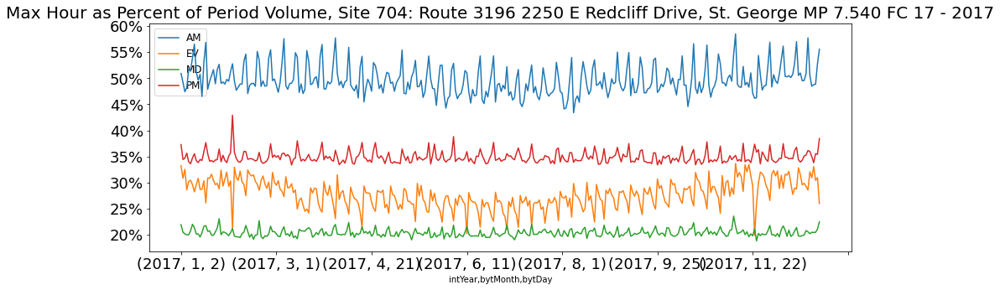

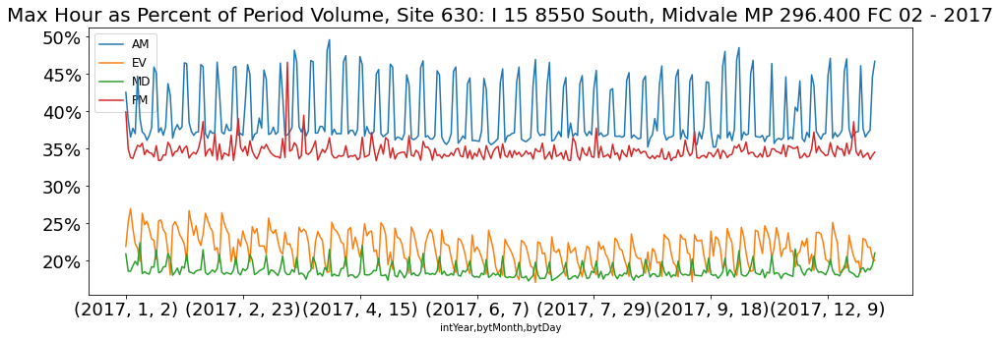

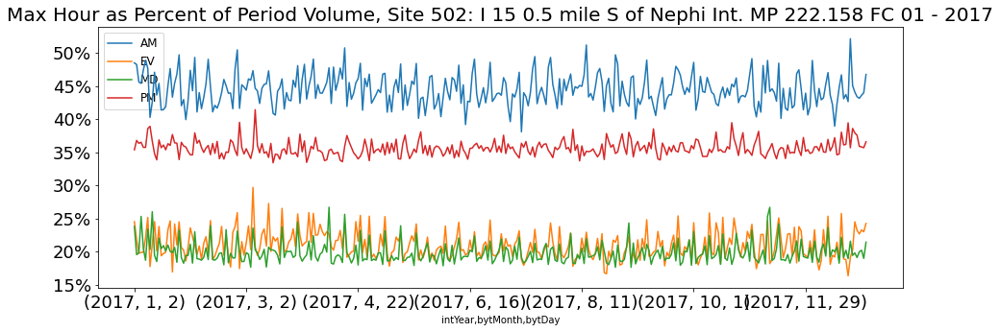

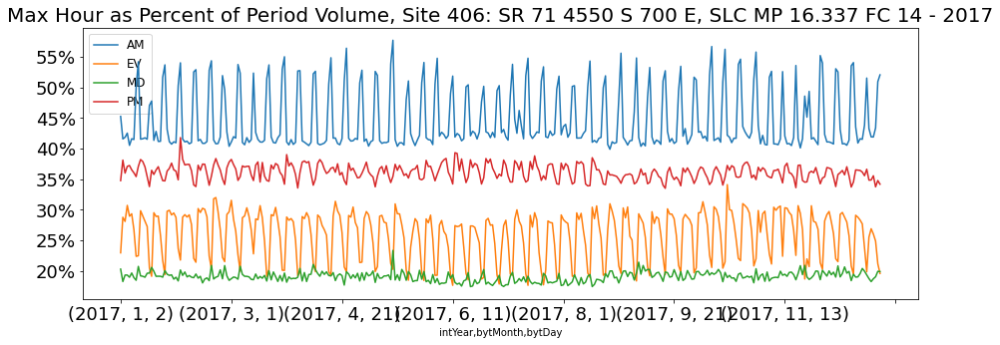

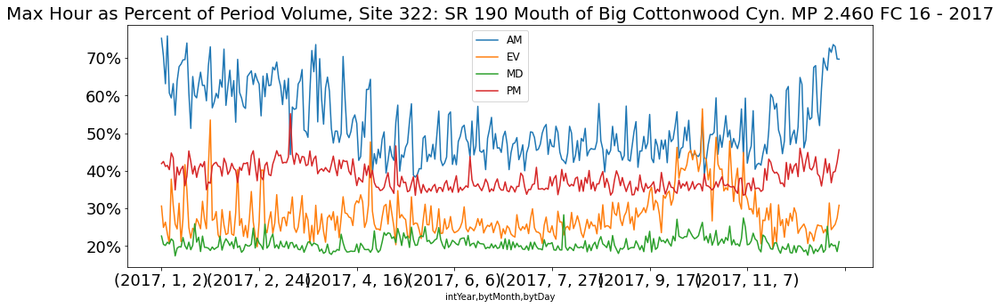

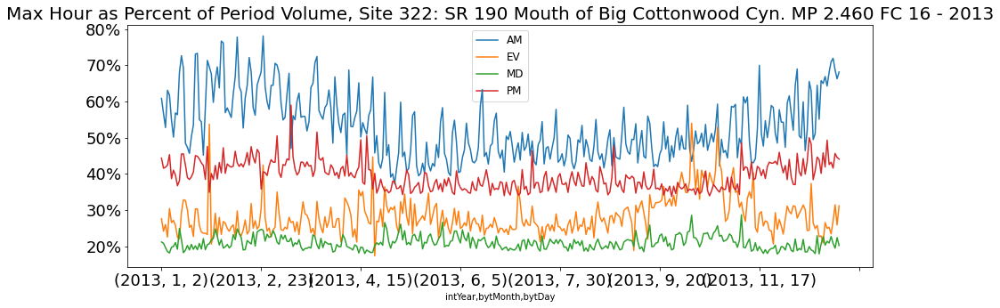

In [214]:
fnPlotSiteYear(704,2017)
fnPlotSiteYear(630,2017)
fnPlotSiteYear(502,2017)
fnPlotSiteYear(406,2017)
fnPlotSiteYear(322,2017)
fnPlotSiteYear(322,2013)

## CCS Groupings

In [215]:
#import groupings

csv_DOWGroups   = os.path.join(dirCCS,  r'tblDOWGroups.csv')
dbf_SeasonGroups = os.path.join(dirCCS,  r'tblMonthGroups.dbf')
csv_SeasonGroups = os.path.join(dirData, r'tblMonthGroups.csv')

dbfToCSV(dbf_SeasonGroups, csv_SeasonGroups)

df_DOWGroups =   pd.read_csv(csv_DOWGroups)
df_SeasonGroups = pd.read_csv(csv_SeasonGroups)

df_SeasonGroups = df_SeasonGroups.drop(columns=['OID_', 'Grouping'])

#rename month group to season group
df_SeasonGroups.columns = ('bytMonth','SeasonGroup')

df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S01-Winter'), 'SeasonGroup'] = 'S01-Win'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S02-Spring'), 'SeasonGroup'] = 'S02-Spr'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S03-Summer'), 'SeasonGroup'] = 'S03-Sum'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S04-Fall'), 'SeasonGroup'] = 'S04-Fal'

display (df_DOWGroups)
display (df_SeasonGroups)

#Aggregate volume data
df_PrdVol_wGroups = pd.DataFrame.merge(df_PrdVol, df_DOWGroups, on='DOW', how='inner')
df_PrdVol_wGroups = pd.DataFrame.merge(df_PrdVol_wGroups, df_SeasonGroups, on='bytMonth', how='inner')

#Aggregate volume data
df_DyVol_wGroups = pd.DataFrame.merge(df_DyVol, df_DOWGroups, on='DOW', how='inner')
df_DyVol_wGroups = pd.DataFrame.merge(df_DyVol_wGroups, df_SeasonGroups, on='bytMonth', how='inner')

display(df_PrdVol_wGroups)
display(df_DyVol_wGroups)

,DOW,DOWGroup
0,1,W2-Weekend
1,2,W1-Weekday
2,3,W1-Weekday
3,4,W1-Weekday
4,5,W1-Weekday
5,6,W2-Weekend
6,7,W2-Weekend
7,1,7-Sunday
8,2,1-Monday
9,3,2-Tuesday


,bytMonth,SeasonGroup
0,1,M01-Jan
1,2,M02-Feb
2,3,M03-Mar
3,4,M04-Apr
4,5,M05-May
5,6,M06-Jun
6,7,M07-Jul
7,8,M08-Aug
8,9,M09-Sep
9,10,M10-Oct


,SiteID,intYear,bytMonth,bytDay,DOW,Period,numHoursPeriod,VolPeriod,VolMaxHour,VolMaxHourPercentPeriod,DOWGroup,SeasonGroup
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,M01-Jan
1,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S01-Win
2,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,Year
3,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,M01-Jan
4,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,S01-Win
...,...,...,...,...,...,...,...,...,...,...,...,...
4360057,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S01-Win
4360058,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,Year
4360059,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,M12-Dec
4360060,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,S01-Win


,SiteID,intYear,bytMonth,bytDay,DOW,numHoursDaily,VolDaily,DOWGroup,SeasonGroup
0,301,2013,1,2,4,24,48604,W1-Weekday,M01-Jan
1,301,2013,1,2,4,24,48604,W1-Weekday,S01-Win
2,301,2013,1,2,4,24,48604,W1-Weekday,Year
3,301,2013,1,2,4,24,48604,3-Wednesday,M01-Jan
4,301,2013,1,2,4,24,48604,3-Wednesday,S01-Win
...,...,...,...,...,...,...,...,...,...
1090015,714,2017,12,26,3,24,2449,W1-Weekday,S01-Win
1090016,714,2017,12,26,3,24,2449,W1-Weekday,Year
1090017,714,2017,12,26,3,24,2449,2-Tuesday,M12-Dec
1090018,714,2017,12,26,3,24,2449,2-Tuesday,S01-Win


In [216]:
def fnPlotSite_DOWSeasonGroup(plotSite, sSeasonGroup, sDOWGroup):
    
    df_plot = df_PrdVol_wGroups.copy()

    df_plot = df_plot[df_plot.SiteID      == plotSite]
    df_plot = df_plot[df_plot.SeasonGroup == sSeasonGroup]
    df_plot = df_plot[df_plot.DOWGroup    == sDOWGroup]

    df_plot = pd.pivot_table(df_plot,
        values='VolMaxHourPercentPeriod',
        index=['intYear','bytMonth','bytDay'],
        columns=['Period']
        )

    sSiteName = df_Sites_bySeasonSiteGroup.loc[df_Sites_bySeasonSiteGroup['SiteID'] == plotSite]['SiteName'].values[0]
    sTitle = "Max Hour as Percent of Period Volume, Site " +  sSiteName + " - " + sSeasonGroup + " " + sDOWGroup

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))



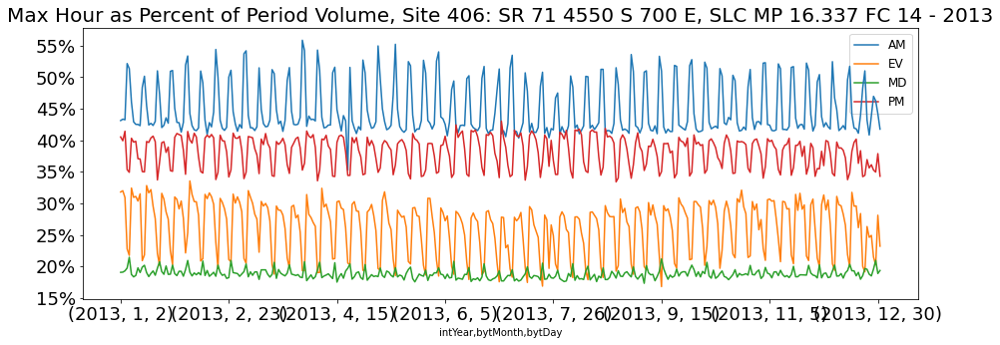

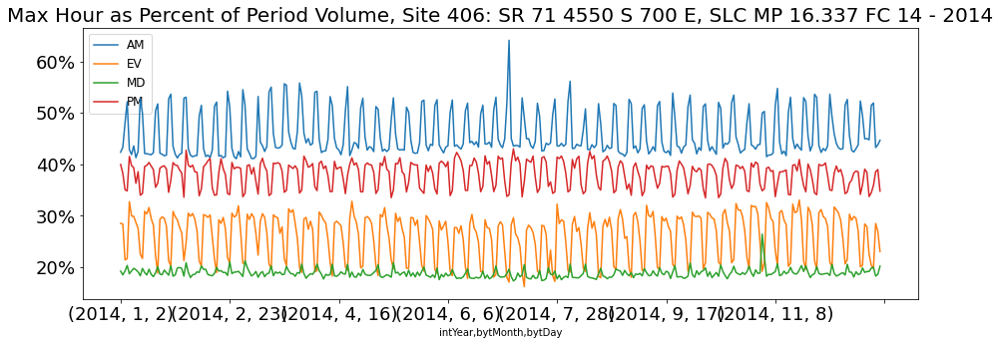

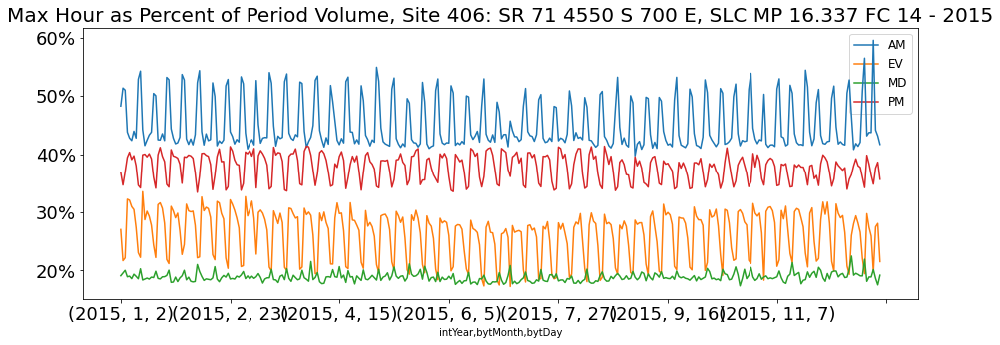

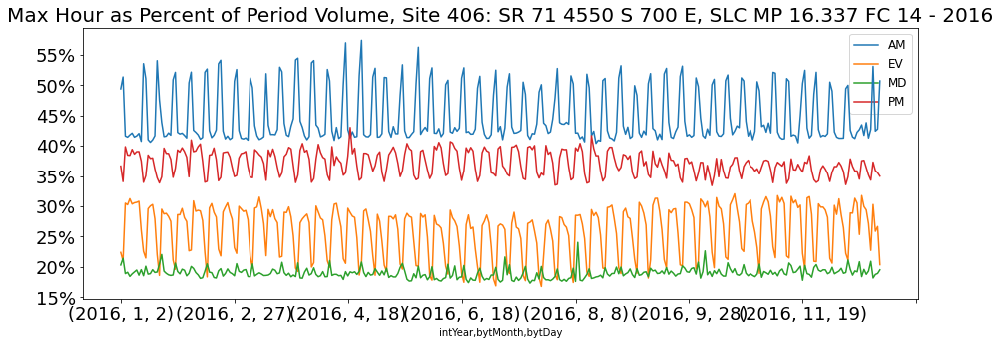

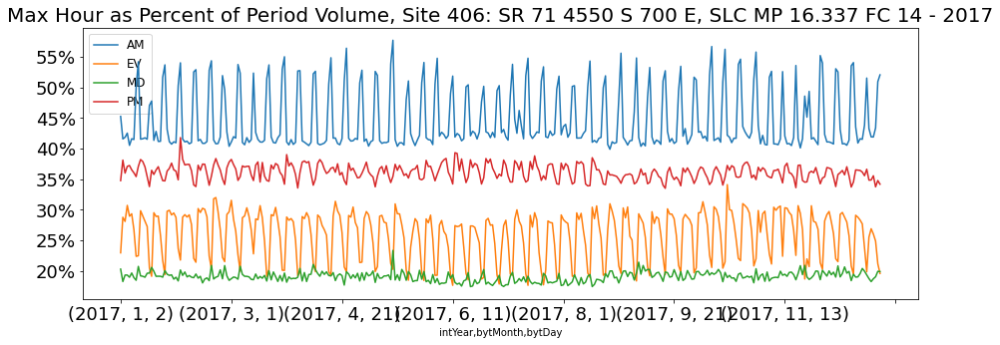

...

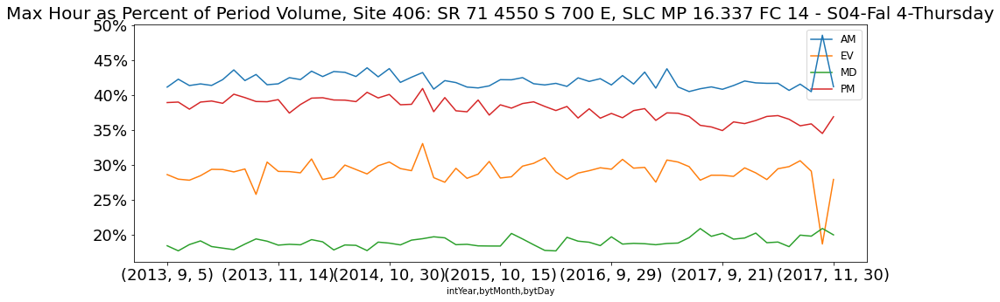

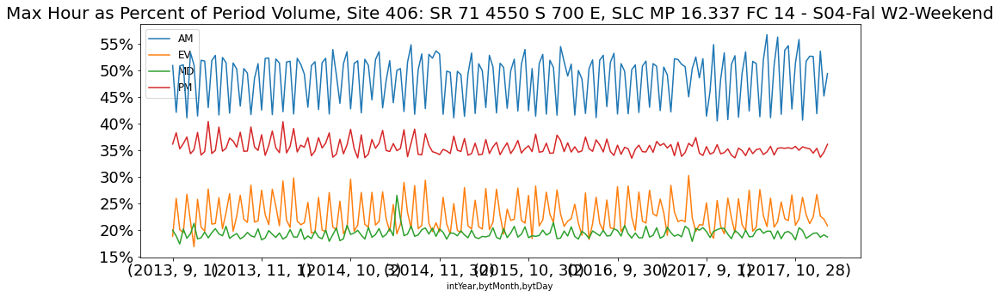

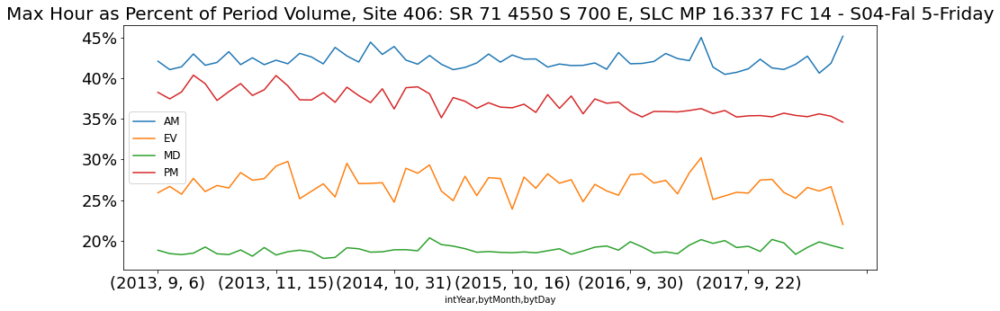

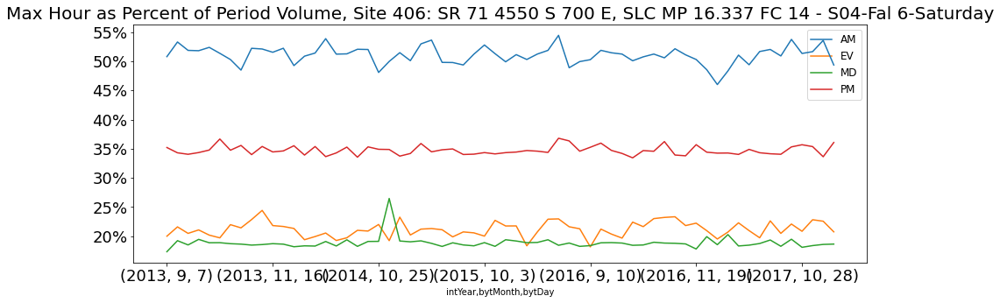

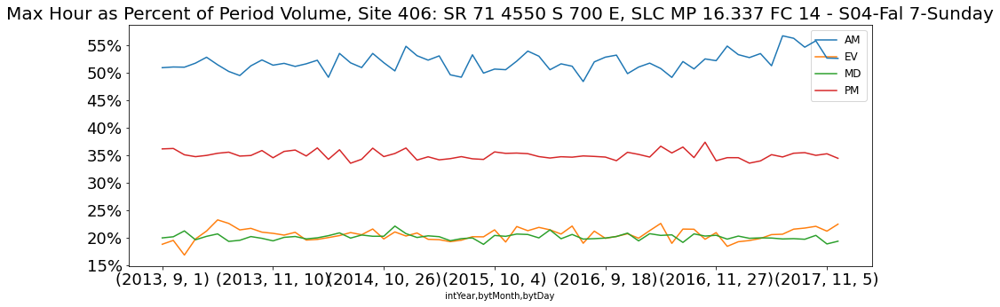

In [218]:
fnPlotSiteYear(406,2013)
fnPlotSiteYear(406,2014)
fnPlotSiteYear(406,2015)
fnPlotSiteYear(406,2016)
fnPlotSiteYear(406,2017)
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','W1-Weekday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','1-Monday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','2-Tuesday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','3-Wednesday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','4-Thursday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','W2-Weekend')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','5-Friday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','6-Saturday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','7-Sunday')

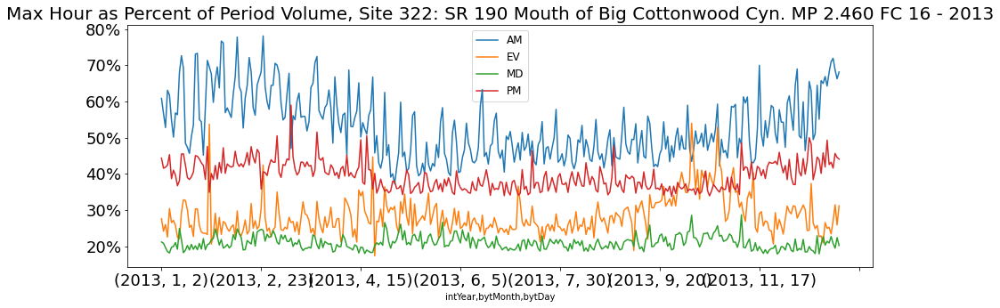

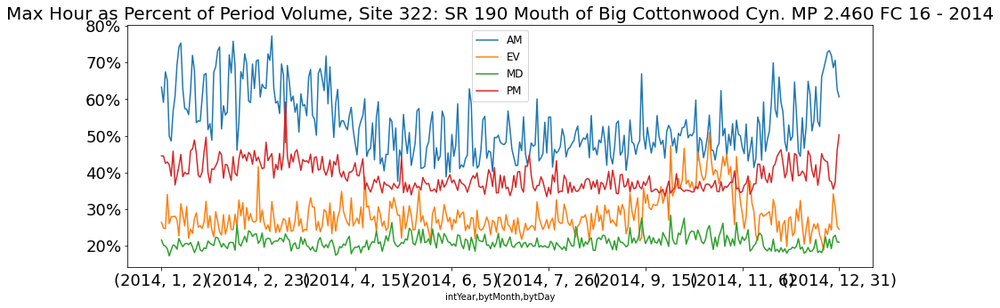

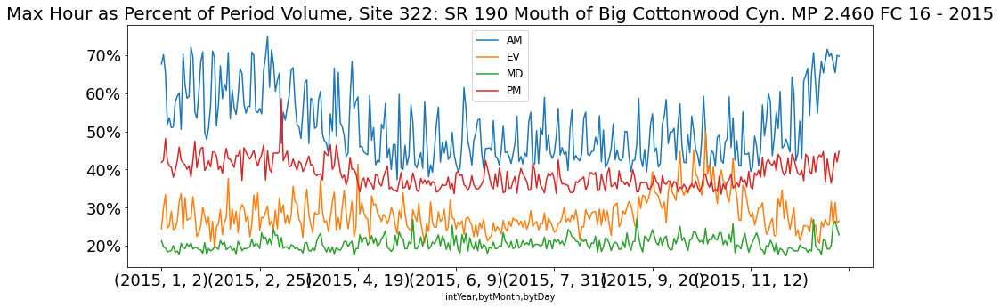

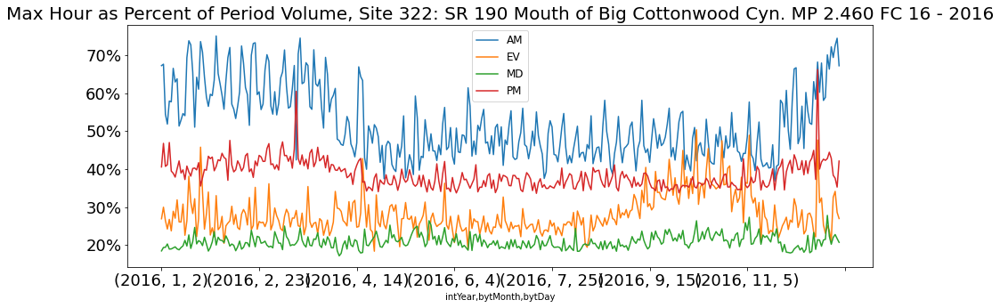

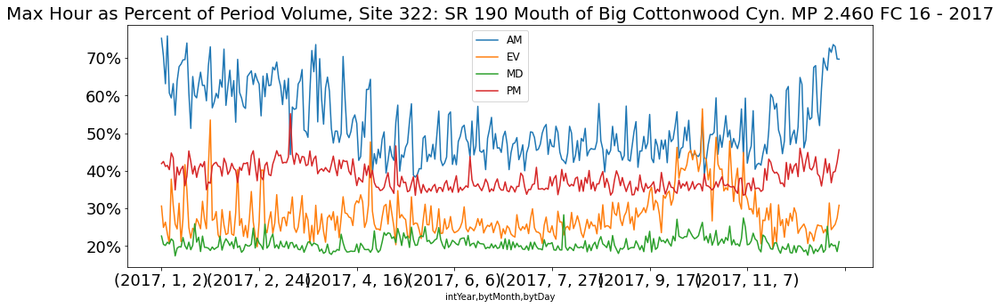

...

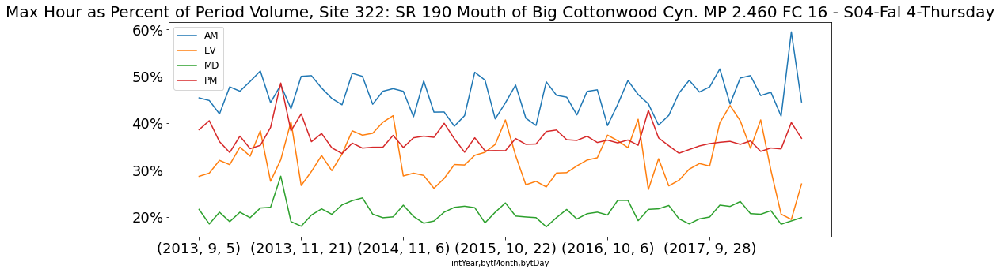

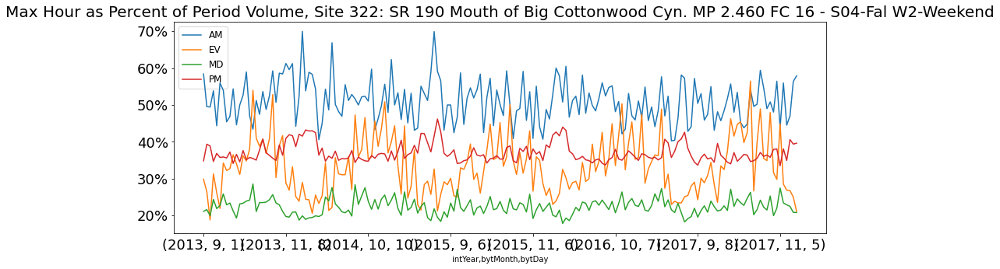

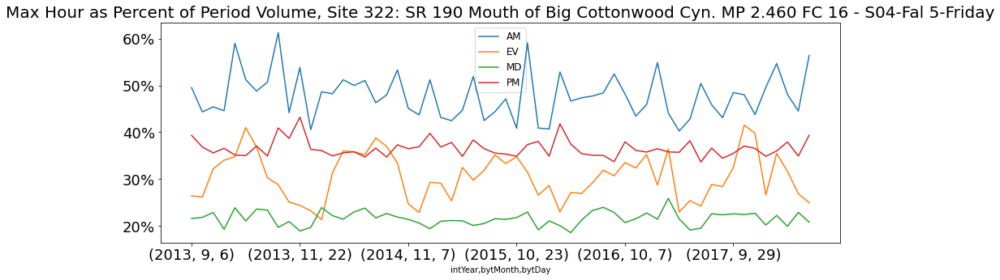

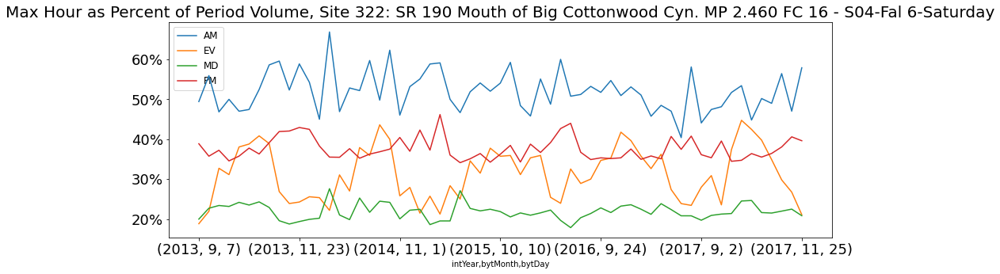

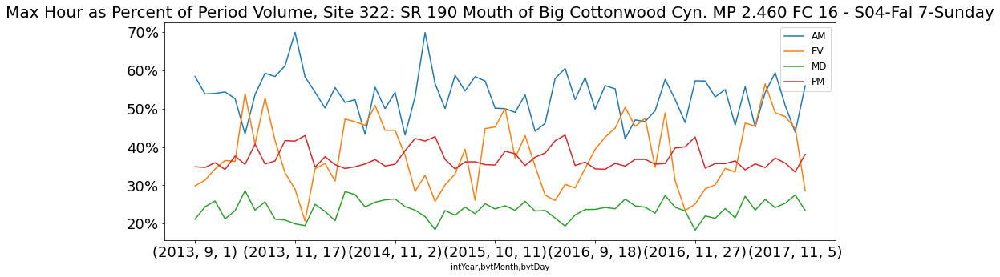

In [219]:
fnPlotSiteYear(322,2013)
fnPlotSiteYear(322,2014)
fnPlotSiteYear(322,2015)
fnPlotSiteYear(322,2016)
fnPlotSiteYear(322,2017)
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','W1-Weekday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','1-Monday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','2-Tuesday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','3-Wednesday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','4-Thursday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','W2-Weekend')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','5-Friday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','6-Saturday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','7-Sunday')

## Combined Period Data by Site into SiteGroup

In [220]:
df_PrdVol_wSiteGroups = pd.DataFrame.merge(df_PrdVol_wGroups, df_Sites_bySeasonSiteGroup, on='SiteID', how='inner')
display(df_PrdVol_wSiteGroups)

df_DyVol_wSiteGroups = pd.DataFrame.merge(df_DyVol_wGroups, df_Sites_bySeasonSiteGroup, on='SiteID', how='inner')

display(df_DyVol_wSiteGroups)

,SiteID,intYear,bytMonth,bytDay,DOW,Period,numHoursPeriod,VolPeriod,VolMaxHour,VolMaxHourPercentPeriod,DOWGroup,SeasonGroup,SiteGroupSeason,SiteName
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
1,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
2,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,Year,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
3,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
4,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4355689,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
4355690,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,Year,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
4355691,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,M12-Dec,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
4355692,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"


,SiteID,intYear,bytMonth,bytDay,DOW,numHoursDaily,VolDaily,DOWGroup,SeasonGroup,SiteGroupSeason,SiteName
0,301,2013,1,2,4,24,48604,W1-Weekday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
1,301,2013,1,2,4,24,48604,W1-Weekday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
2,301,2013,1,2,4,24,48604,W1-Weekday,Year,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
3,301,2013,1,2,4,24,48604,3-Wednesday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
4,301,2013,1,2,4,24,48604,3-Wednesday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
...,...,...,...,...,...,...,...,...,...,...,...
1088923,714,2017,12,26,3,24,2449,W1-Weekday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088924,714,2017,12,26,3,24,2449,W1-Weekday,Year,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088925,714,2017,12,26,3,24,2449,2-Tuesday,M12-Dec,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088926,714,2017,12,26,3,24,2449,2-Tuesday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"


In [221]:
#AGGREGATE OVER SITES
#preserve year,month,day values to display change of factor over time. will aggregate later to final dataset

df_PrdSiteGroupVol = df_PrdVol_wSiteGroups.groupby(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','Period'], as_index=False).agg({'VolPeriod':[np.sum],'VolMaxHour':[np.sum],'SiteID':[np.size]})
df_PrdSiteGroupVol.columns = (['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','Period','VolPeriodSum','VolMaxHourSum','numSites'])
df_PrdSiteGroupVol['VolMaxHourPercentPeriod'] = df_PrdSiteGroupVol['VolMaxHourSum'] / df_PrdSiteGroupVol['VolPeriodSum']
display(df_PrdSiteGroupVol)

df_DySiteGroupVol = df_DyVol_wSiteGroups.groupby(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW'], as_index=False).agg({'VolDaily':[np.sum],'SiteID':[np.size]})
df_DySiteGroupVol.columns = (['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','VolDailySum','numSites'])
display(df_DySiteGroupVol)

df_PrdSiteGroupVol_wDaily = pd.DataFrame.merge(df_PrdSiteGroupVol,df_DySiteGroupVol,on=(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','numSites']),how='inner')
df_PrdSiteGroupVol_wDaily['VolMaxHourPercentDaily'] = df_PrdSiteGroupVol_wDaily['VolMaxHourSum'] / df_PrdSiteGroupVol_wDaily['VolDailySum']
display(df_PrdSiteGroupVol_wDaily)

,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Period,VolPeriodSum,VolMaxHourSum,numSites,VolMaxHourPercentPeriod
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333
1,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270
2,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762
3,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000
4,SN0,1-Monday,M01-Jan,2013,1,14,2,AM,25,14,2,0.560000
...,...,...,...,...,...,...,...,...,...,...,...,...
1335691,SNX,W2-Weekend,Year,2017,12,30,7,PM,28548,10302,3,0.360866
1335692,SNX,W2-Weekend,Year,2017,12,31,1,AM,6219,3187,3,0.512462
1335693,SNX,W2-Weekend,Year,2017,12,31,1,EV,21951,4738,3,0.215844
1335694,SNX,W2-Weekend,Year,2017,12,31,1,MD,38881,7518,3,0.193359


,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,VolDailySum,numSites
0,SN0,1-Monday,M01-Jan,2013,1,7,2,275,2
1,SN0,1-Monday,M01-Jan,2013,1,14,2,242,2
2,SN0,1-Monday,M01-Jan,2013,1,28,2,332,2
3,SN0,1-Monday,M01-Jan,2014,1,6,2,394,2
4,SN0,1-Monday,M01-Jan,2014,1,13,2,331,2
...,...,...,...,...,...,...,...,...,...
333919,SNX,W2-Weekend,Year,2017,12,22,6,138073,3
333920,SNX,W2-Weekend,Year,2017,12,23,7,115094,3
333921,SNX,W2-Weekend,Year,2017,12,29,6,142479,3
333922,SNX,W2-Weekend,Year,2017,12,30,7,127146,3


,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Period,VolPeriodSum,VolMaxHourSum,numSites,VolMaxHourPercentPeriod,VolDailySum,VolMaxHourPercentDaily
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333,275,0.029091
1,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270,275,0.036364
2,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762,275,0.123636
3,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000,275,0.138182
4,SN0,1-Monday,M01-Jan,2013,1,14,2,AM,25,14,2,0.560000,242,0.057851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335673,SNX,W2-Weekend,Year,2017,12,30,7,PM,28548,10302,3,0.360866,127146,0.081025
1335674,SNX,W2-Weekend,Year,2017,12,31,1,AM,6219,3187,3,0.512462,86018,0.037050
1335675,SNX,W2-Weekend,Year,2017,12,31,1,EV,21951,4738,3,0.215844,86018,0.055081
1335676,SNX,W2-Weekend,Year,2017,12,31,1,MD,38881,7518,3,0.193359,86018,0.087400


In [222]:
def fnPlotSiteGroup_DOWSeasonGroup(plotSiteGroup, sSeasonGroup, sDOWGroup, sPeriodOrDaily):
    
    df_plot = df_PrdSiteGroupVol_wDaily.copy()

    df_plot = df_plot[df_plot.SiteGroupSeason   == plotSiteGroup]
    df_plot = df_plot[df_plot.SeasonGroup       == sSeasonGroup]
    df_plot = df_plot[df_plot.DOWGroup          == sDOWGroup]

    if sPeriodOrDaily == 'Period':
        sValue = 'VolMaxHourPercentPeriod'
    elif sPeriodOrDaily == 'Daily':
        sValue = 'VolMaxHourPercentDaily'        
    
    df_plot = pd.pivot_table(df_plot,
        values=sValue,
        index=['intYear','bytMonth','bytDay'],
        columns=['Period']
        )

    sSiteName = df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnGrp'].values[0] + ' - ' + df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnVolCls'].values[0] + ' - ' +df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnATGroup'].values[0]
    sTitle = sValue + ": " + str(plotSiteGroup) + ": " +  sSiteName + " - " + sSeasonGroup + " " + sDOWGroup

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    if sPeriodOrDaily == 'Period':
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))
    elif sPeriodOrDaily == 'Daily':
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.1%}'))  
    


In [223]:
df_SeasonSiteGroups

,SiteGroupSeason,SsnGrp,SsnATGroup,SsnVolCls
0,SN0,AlpineLoop,0-AllAreaTypes,0-AllVolumes
1,SN1,BearLake,0-AllAreaTypes,0-AllVolumes
2,SN2,BigCottonwood,0-AllAreaTypes,0-AllVolumes
3,SN3,CedarBreaks,0-AllAreaTypes,0-AllVolumes
4,SN4,FreewayI15,1-Rural,0-AllVolumes
5,SN5,FreewayI15,2-Transition,0-AllVolumes
6,SN6,FreewayI15,3-Suburban,0-AllVolumes
7,SN7,FreewayI15,4-Urban,0-AllVolumes
8,XX1,FreewayI15,5-CBD,0-AllVolumes
9,SN8,FreewayI215,0-AllAreaTypes,0-AllVolumes


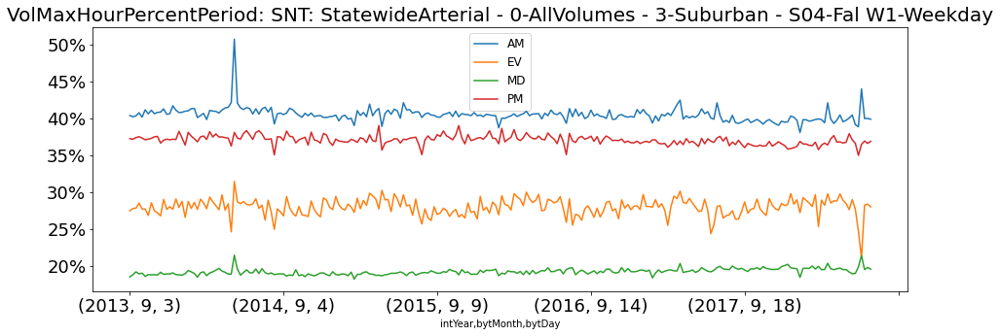

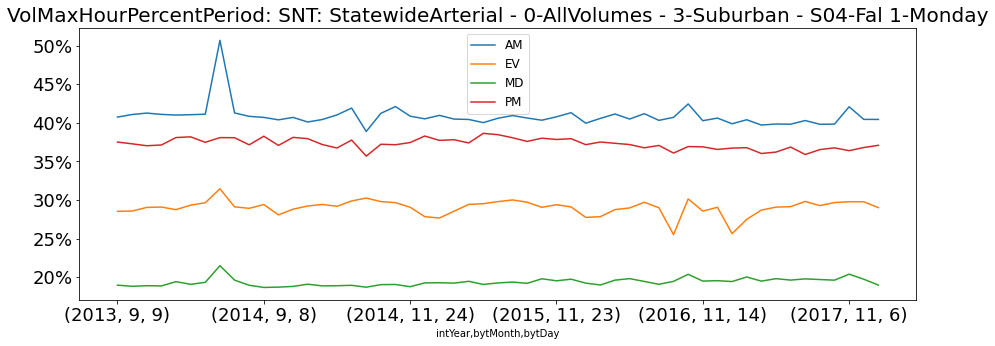

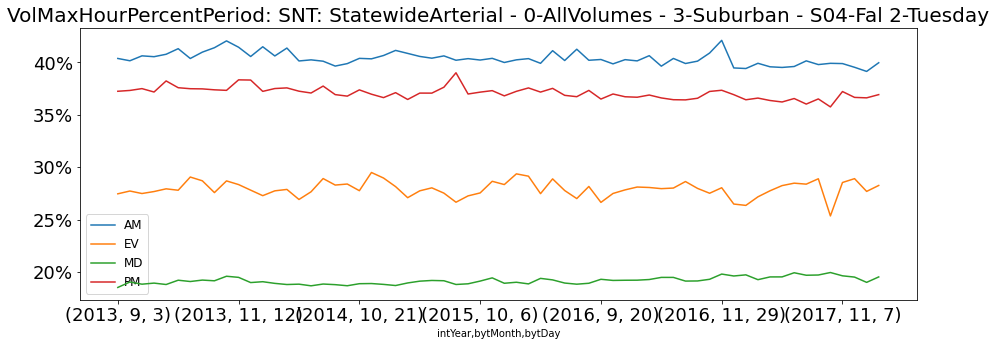

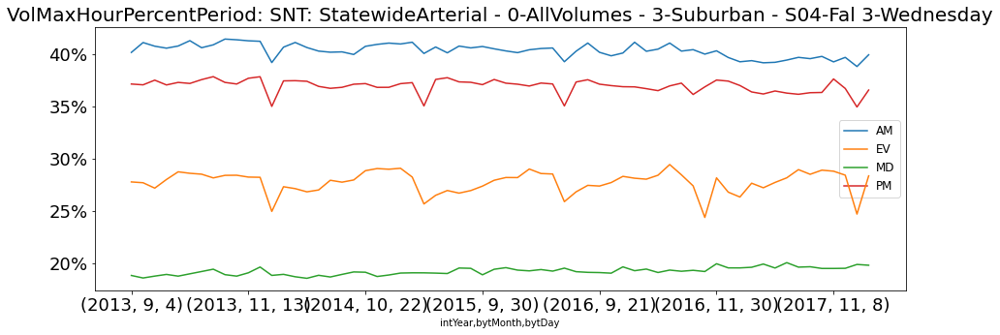

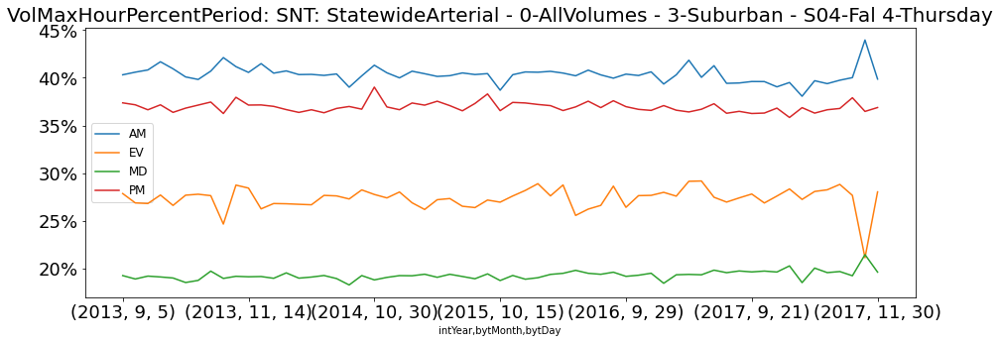

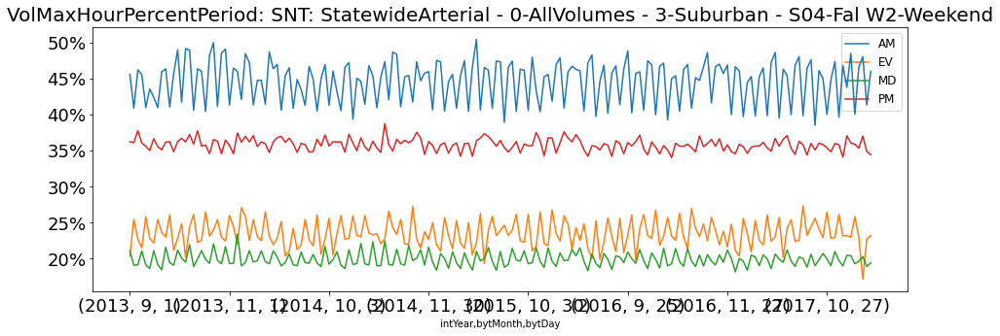

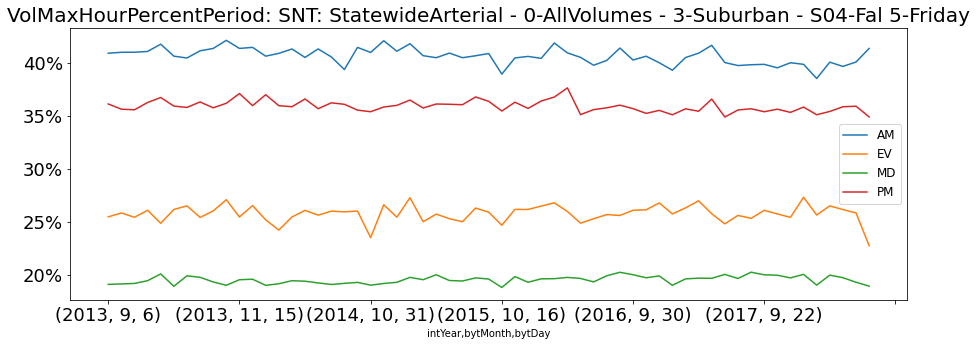

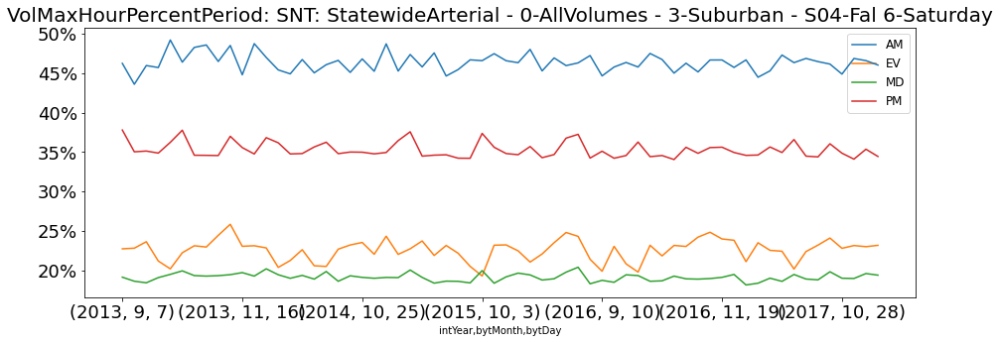

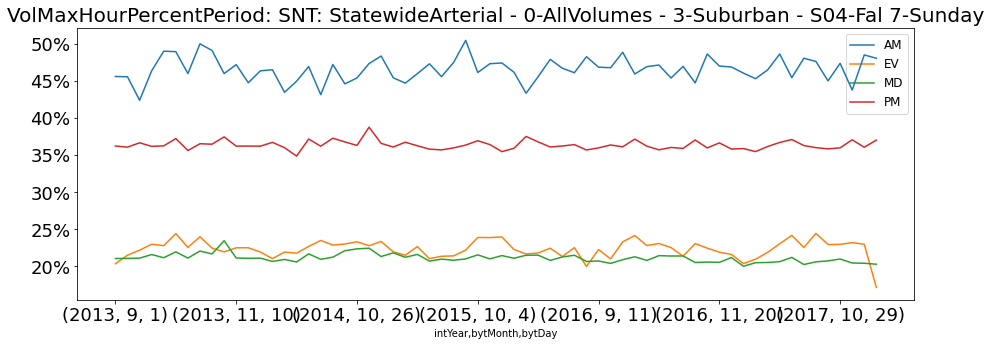

In [224]:
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W1-Weekday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','1-Monday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','2-Tuesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','3-Wednesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','4-Thursday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W2-Weekend','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','5-Friday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','6-Saturday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','7-Sunday','Period')

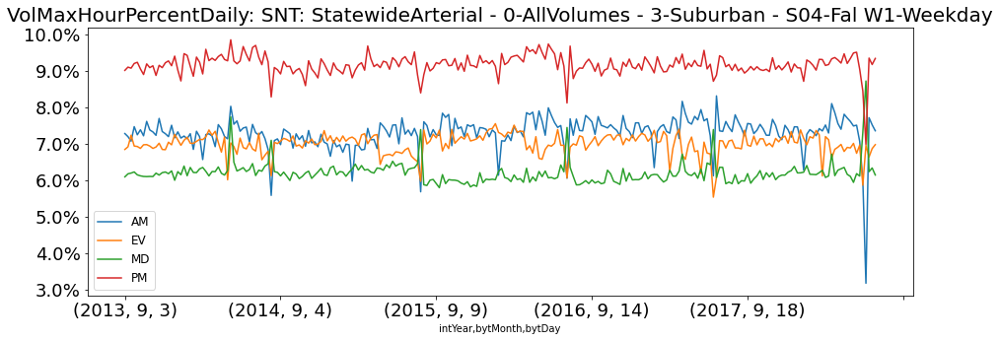

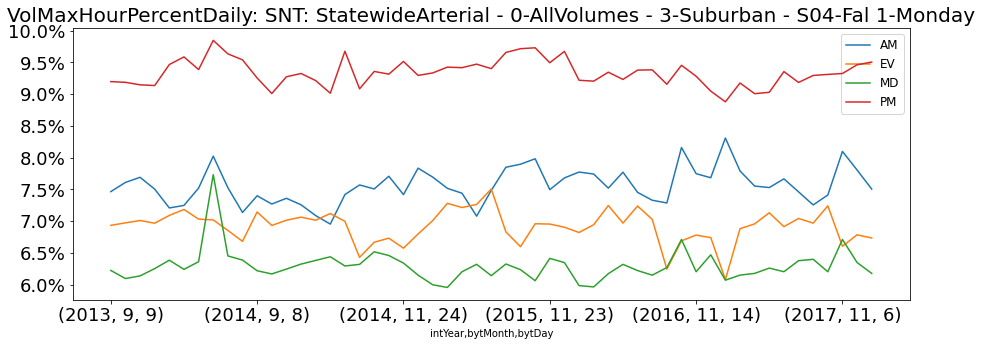

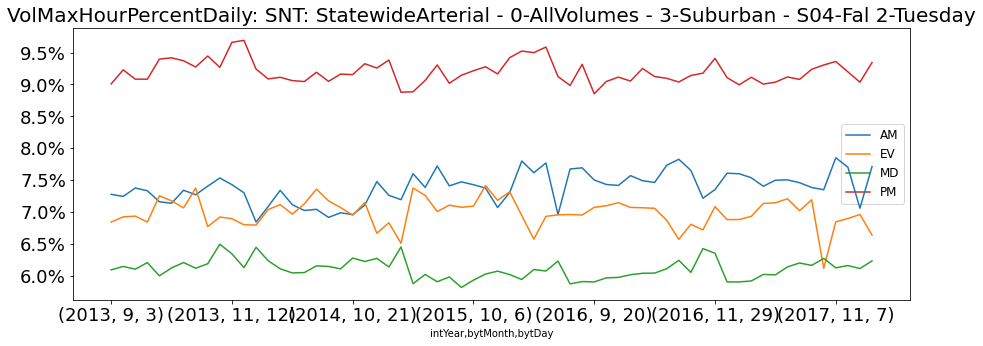

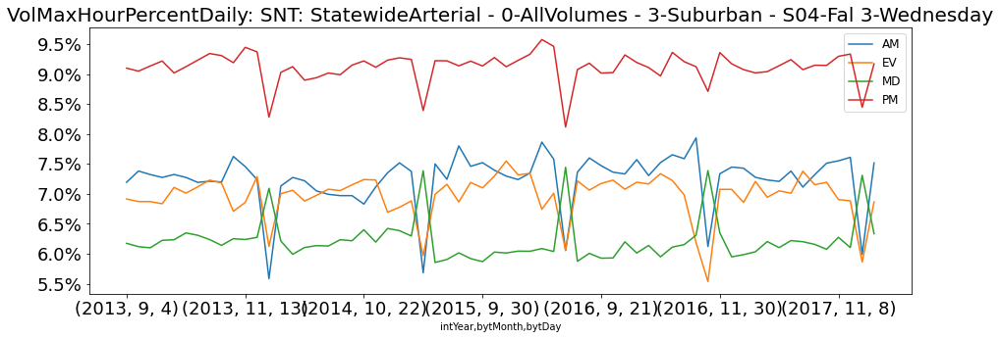

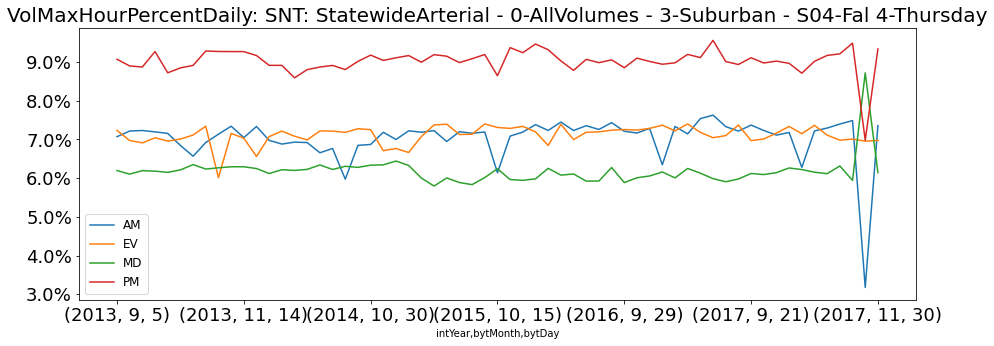

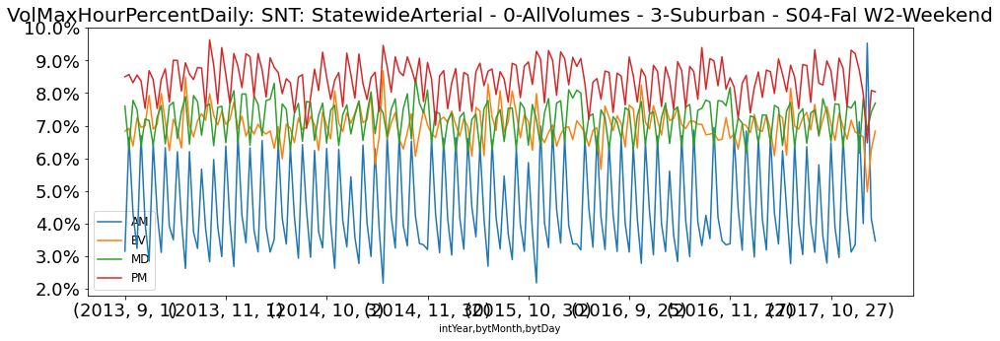

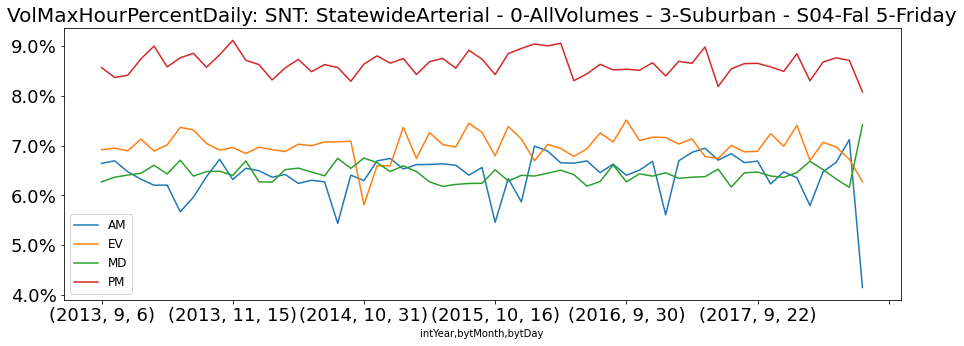

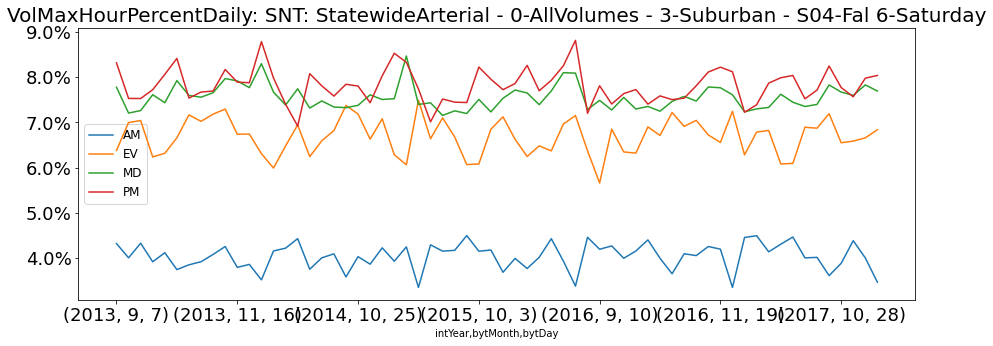

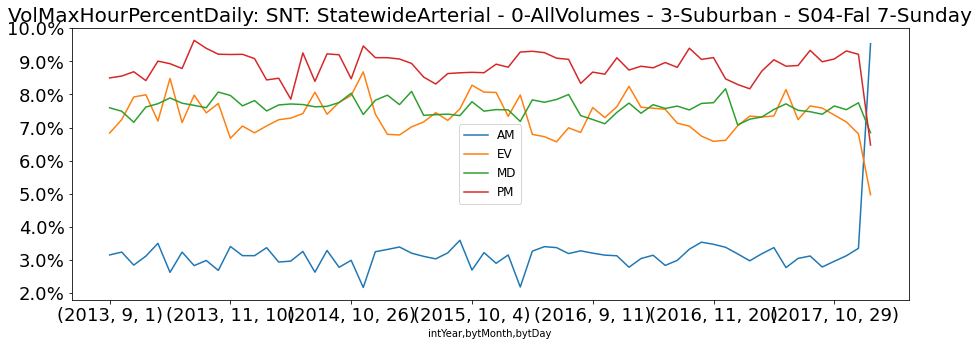

In [225]:
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W1-Weekday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','1-Monday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','2-Tuesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','3-Wednesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','4-Thursday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W2-Weekend','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','5-Friday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','6-Saturday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','7-Sunday','Daily')

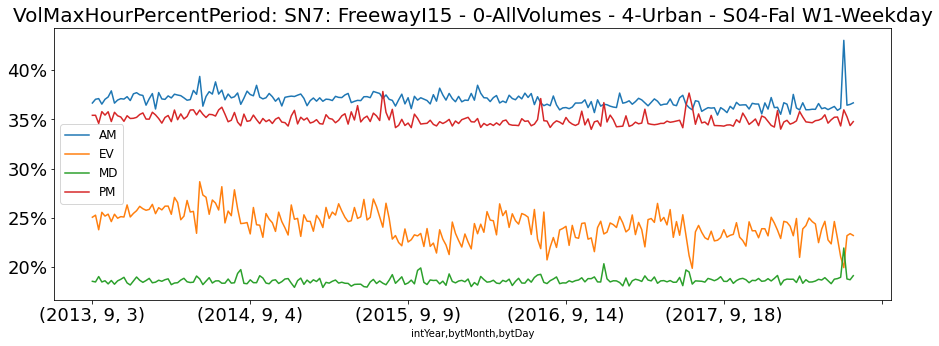

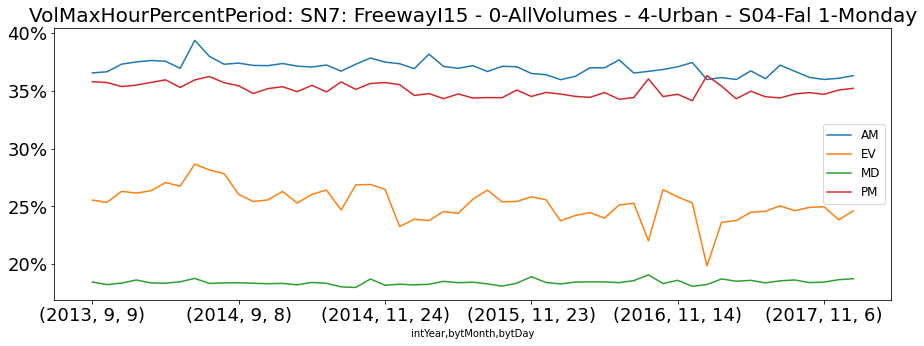

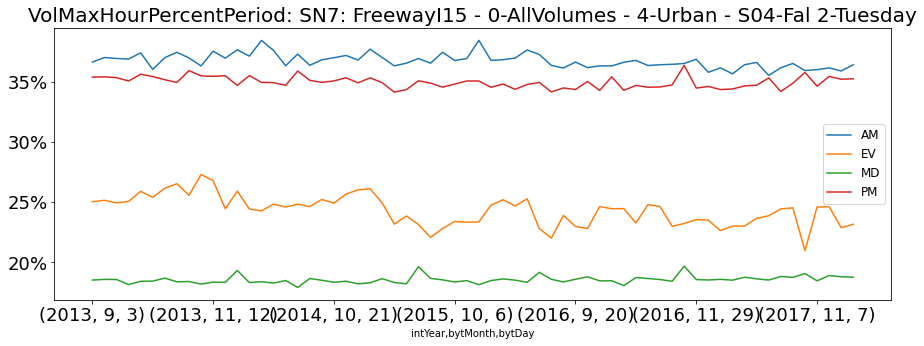

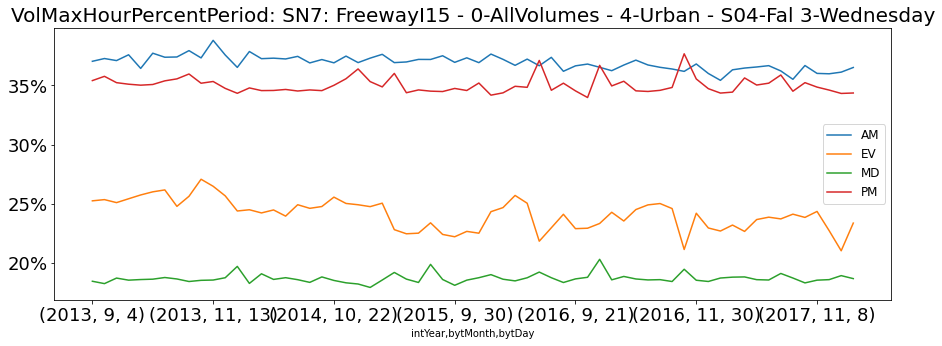

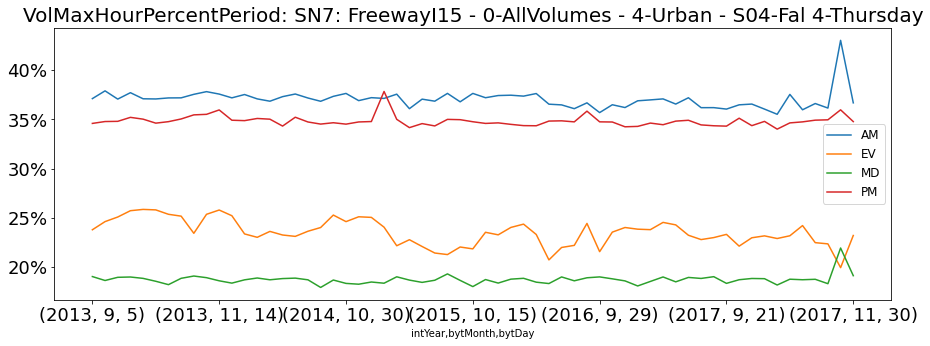

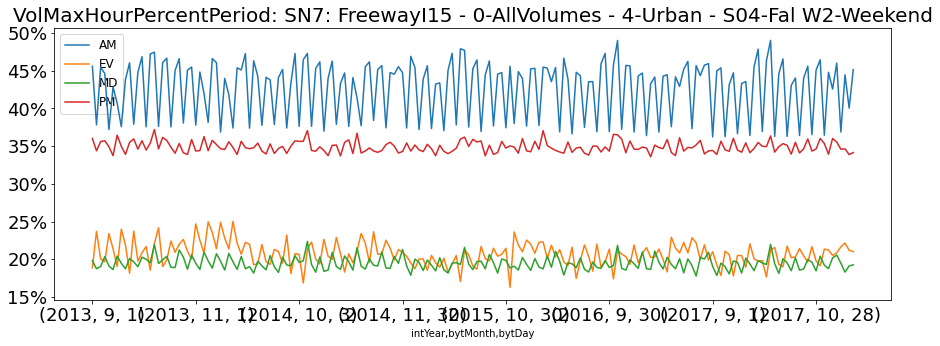

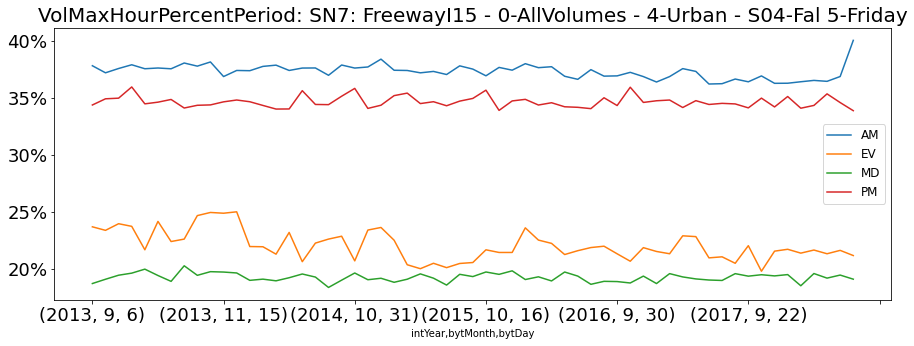

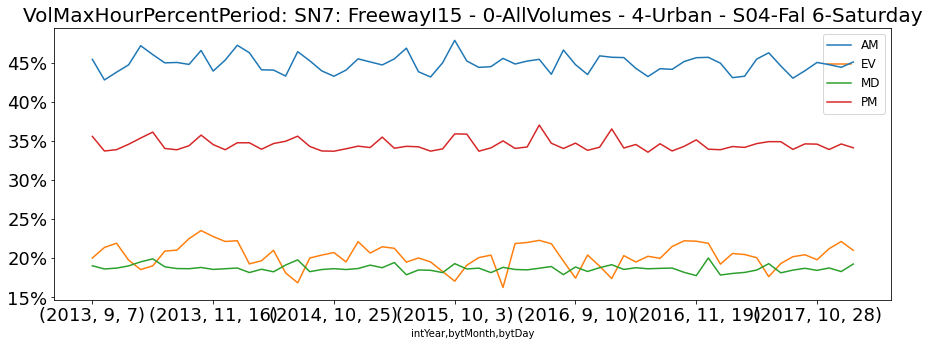

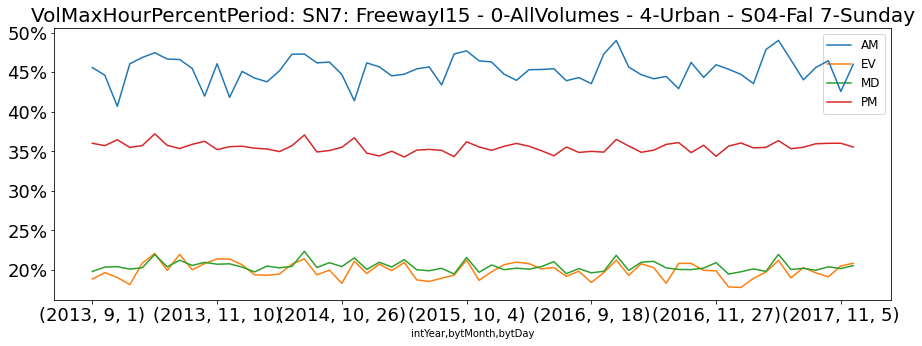

In [226]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W1-Weekday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','1-Monday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','2-Tuesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','3-Wednesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','4-Thursday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W2-Weekend','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','5-Friday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','6-Saturday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','7-Sunday','Period')

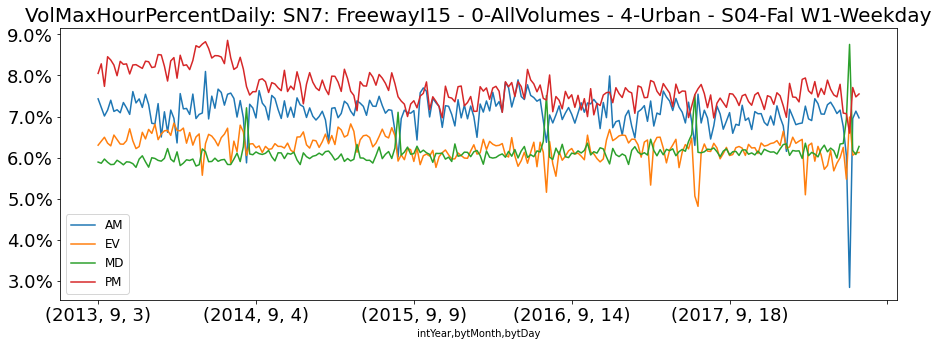

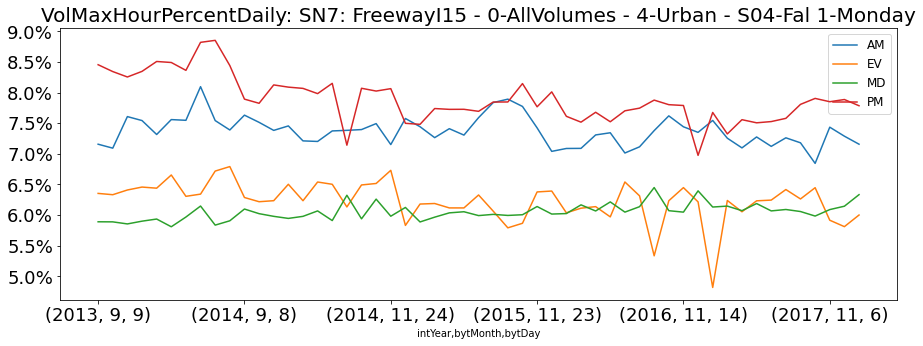

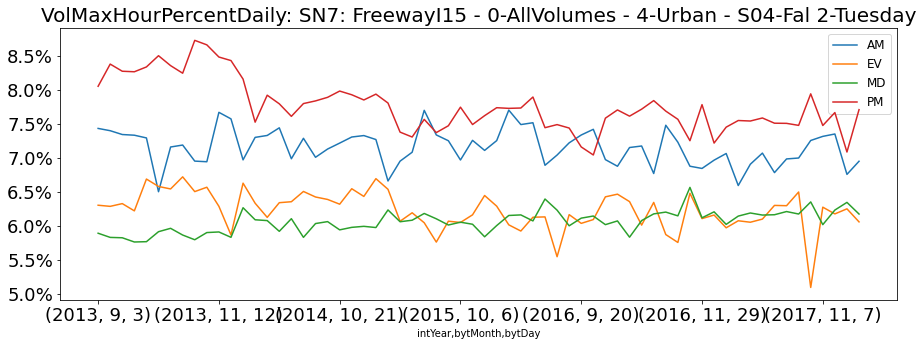

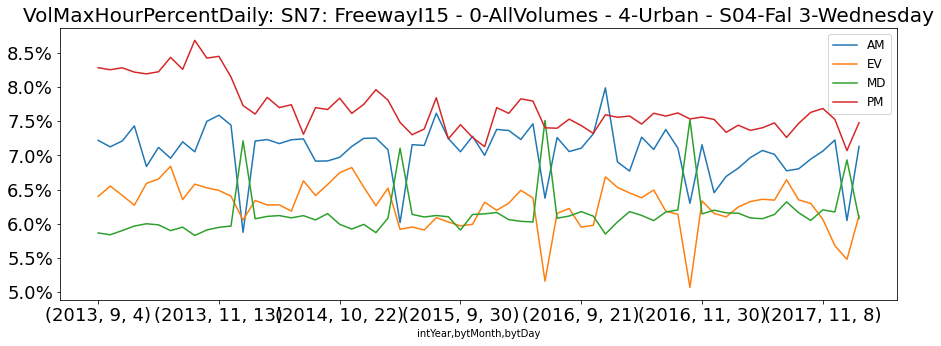

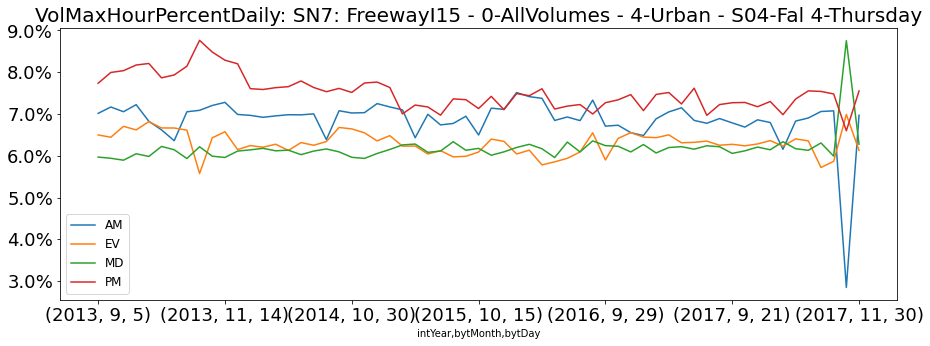

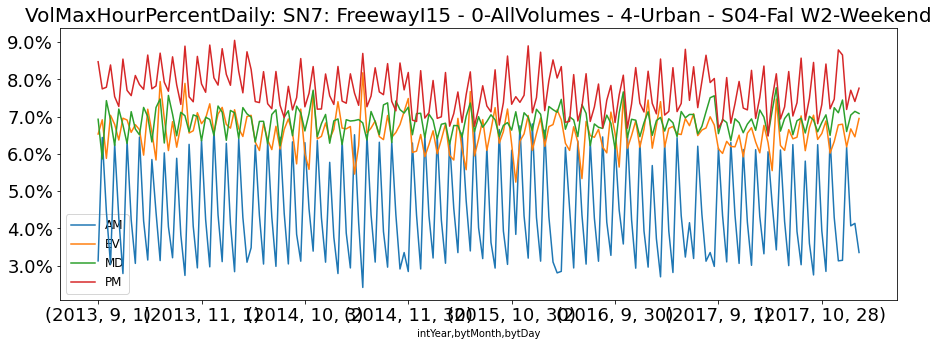

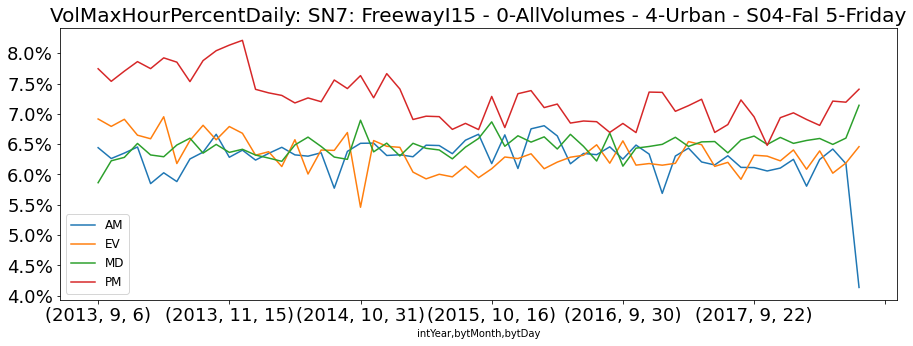

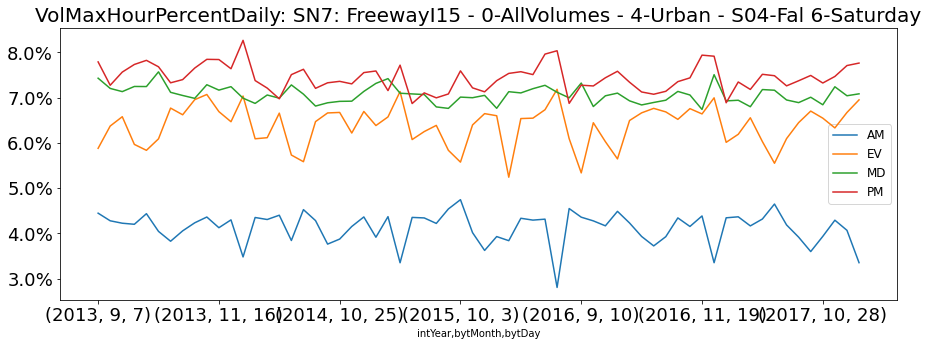

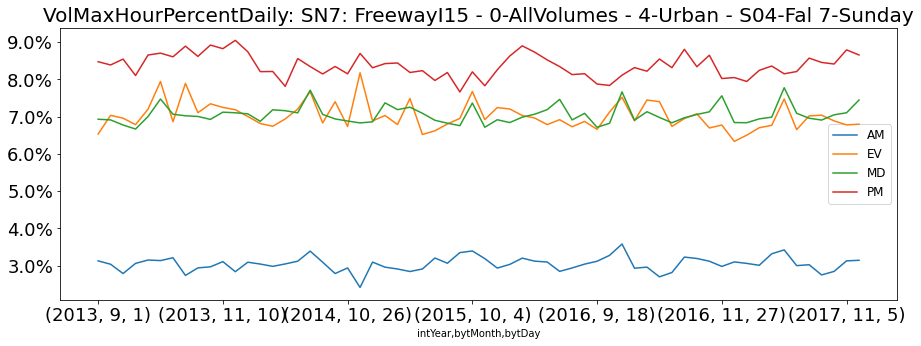

In [227]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W1-Weekday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','1-Monday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','2-Tuesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','3-Wednesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','4-Thursday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W2-Weekend','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','5-Friday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','6-Saturday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','7-Sunday','Daily')

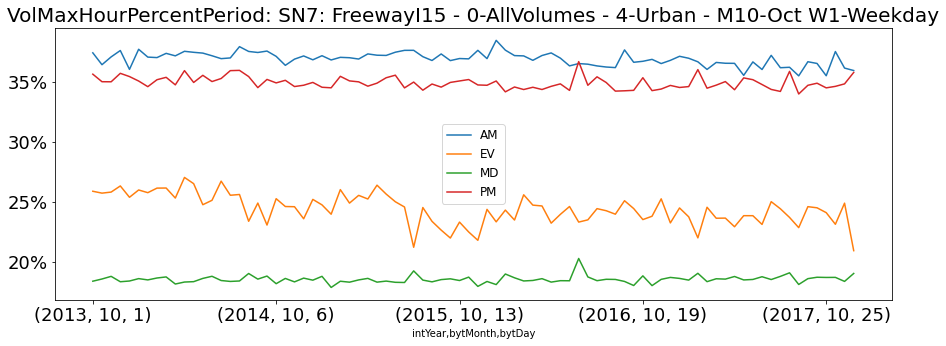

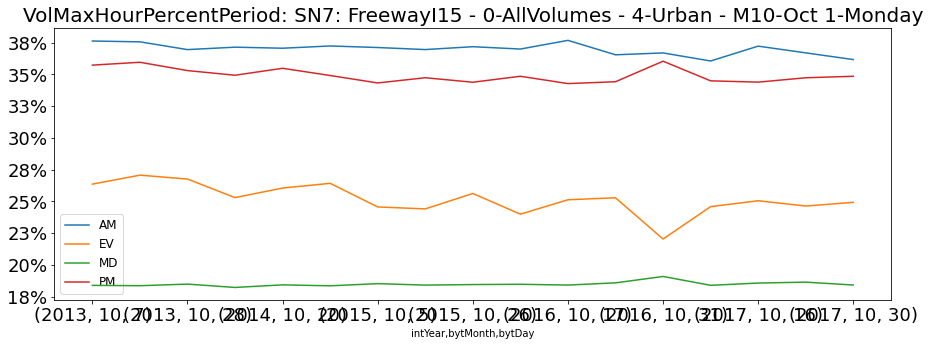

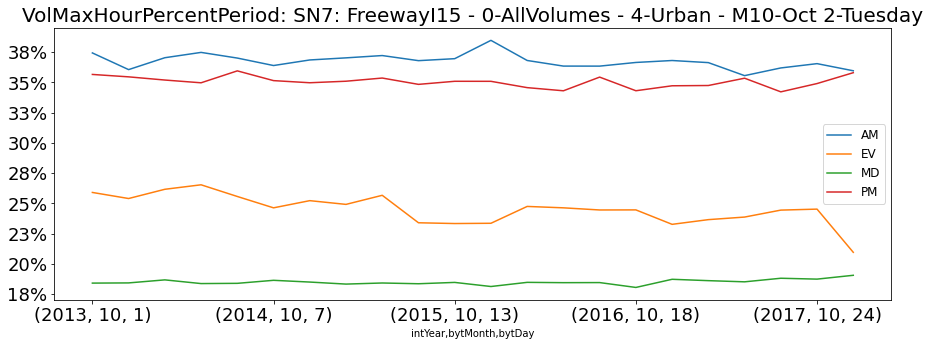

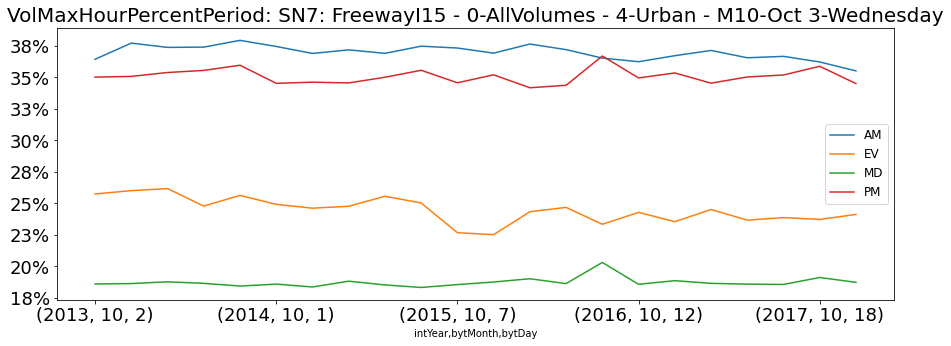

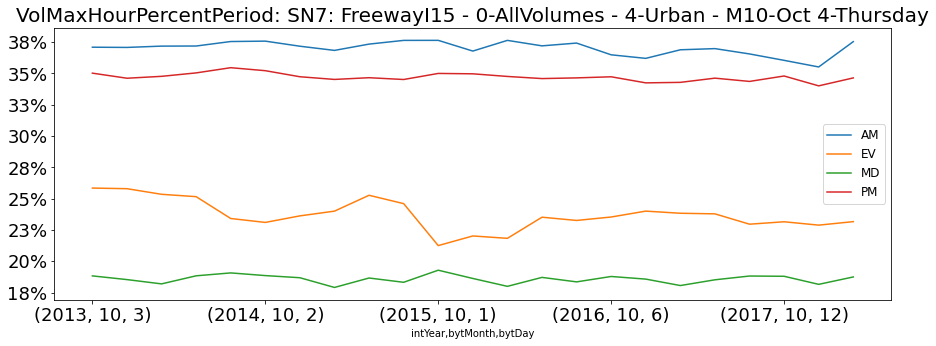

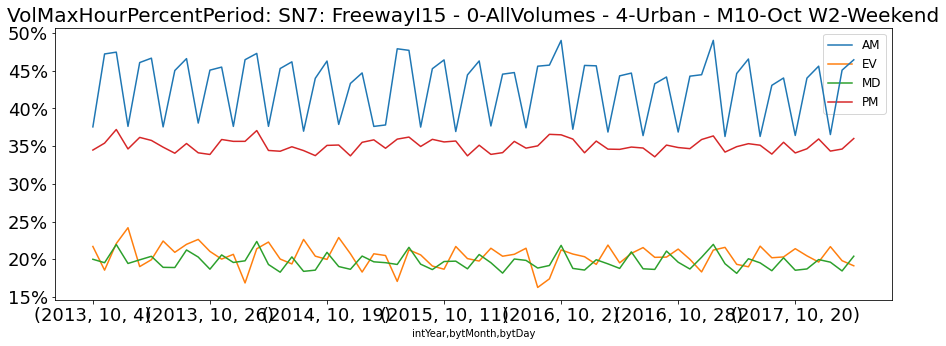

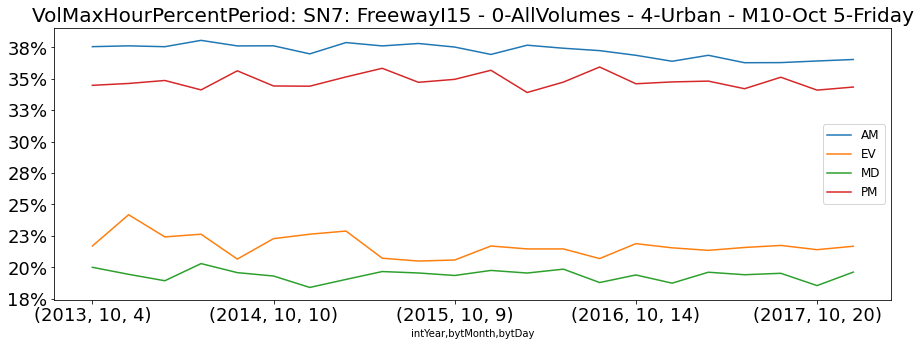

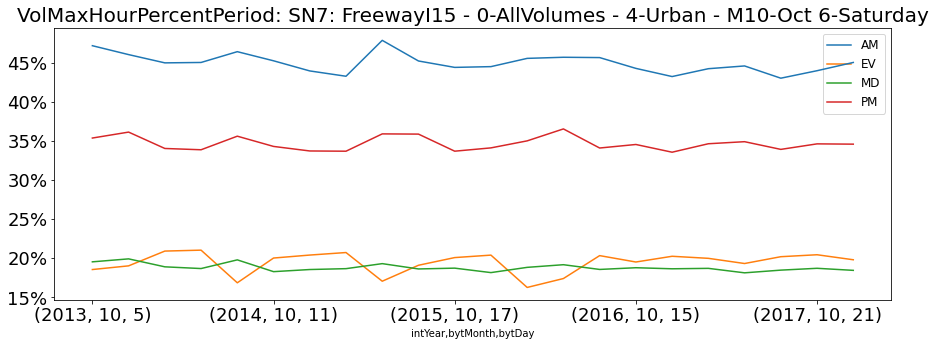

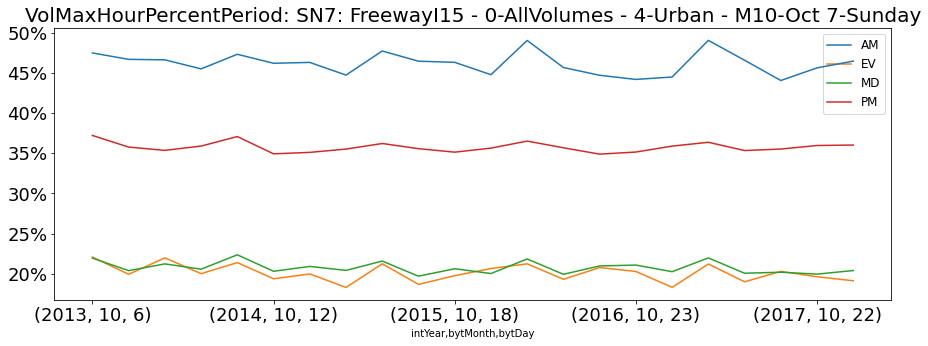

In [228]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W1-Weekday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','1-Monday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','2-Tuesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','3-Wednesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','4-Thursday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W2-Weekend','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','5-Friday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','6-Saturday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','7-Sunday','Period')

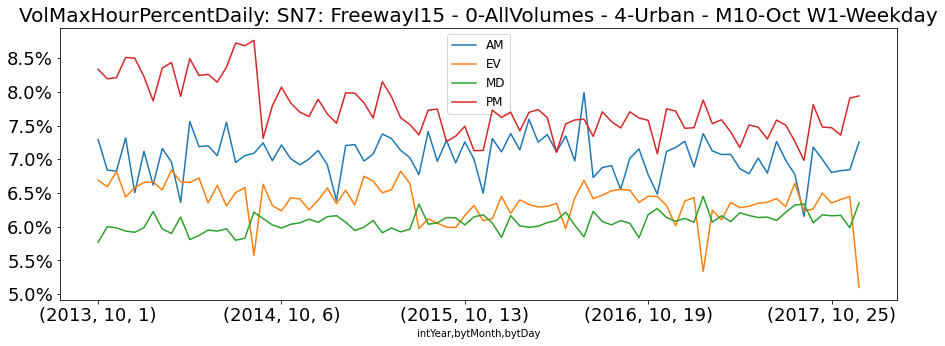

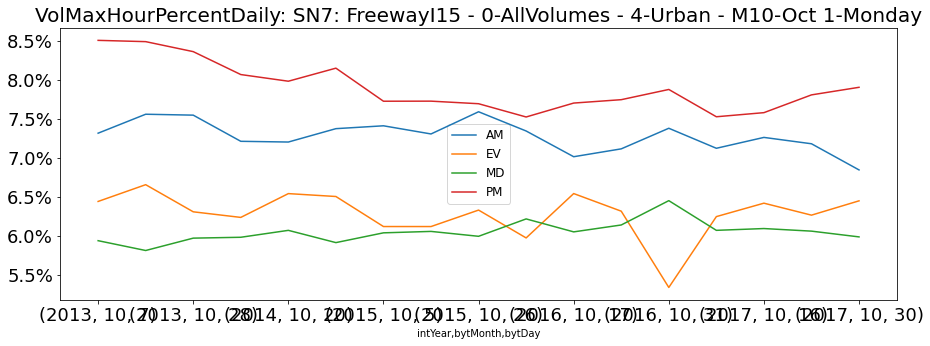

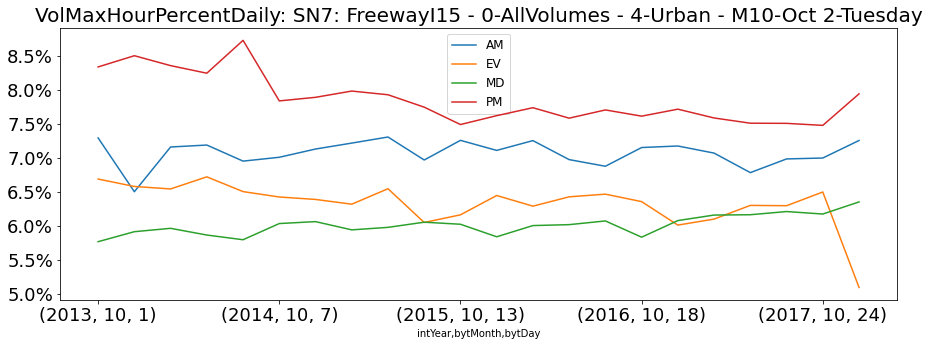

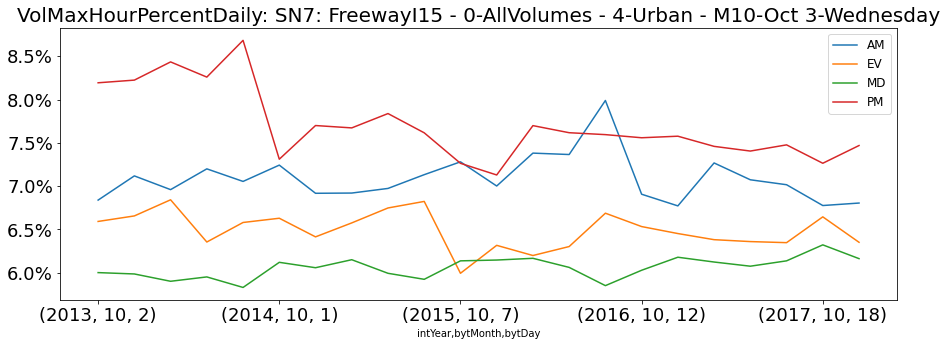

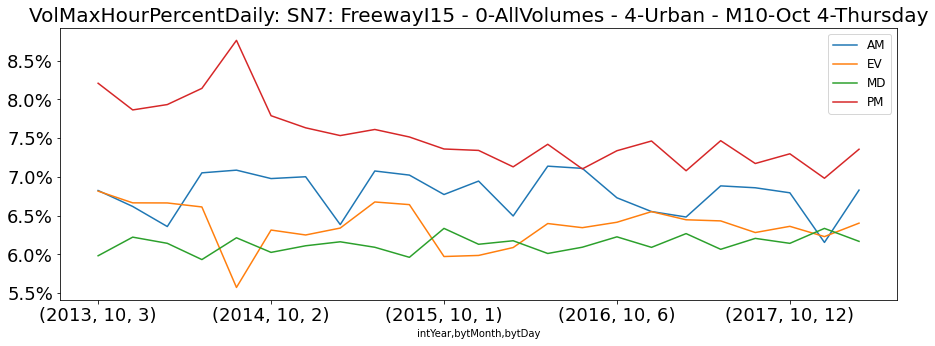

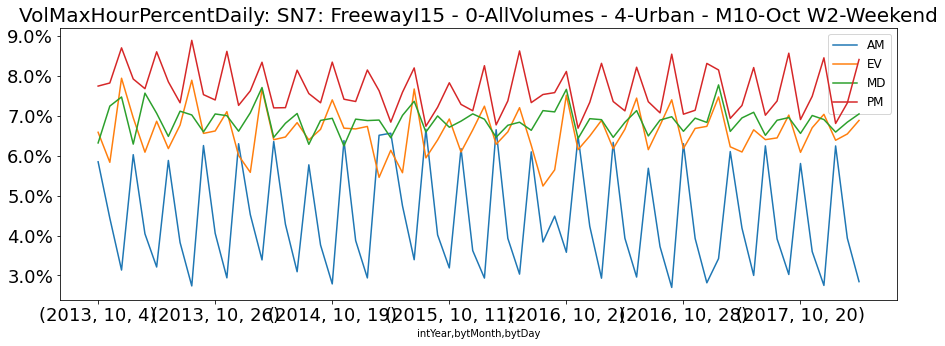

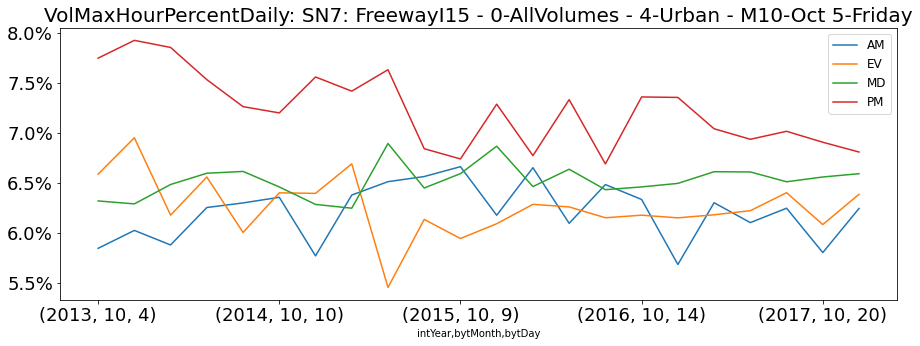

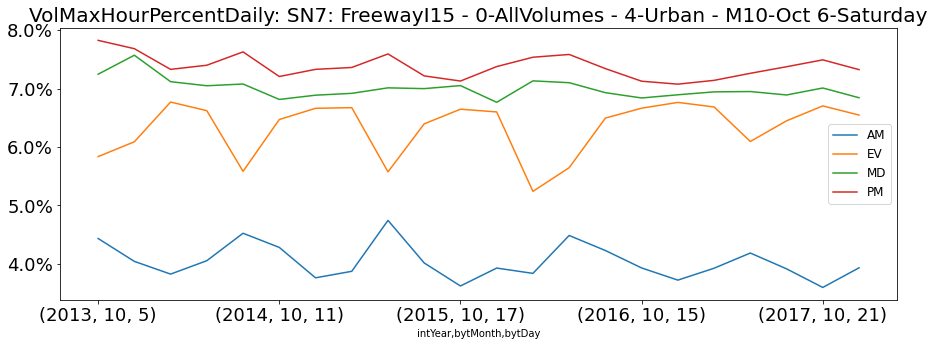

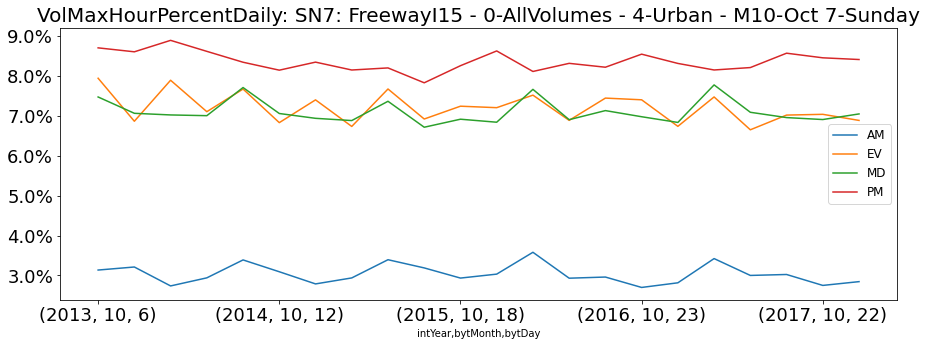

In [229]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W1-Weekday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','1-Monday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','2-Tuesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','3-Wednesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','4-Thursday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W2-Weekend','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','5-Friday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','6-Saturday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','7-Sunday','Daily')

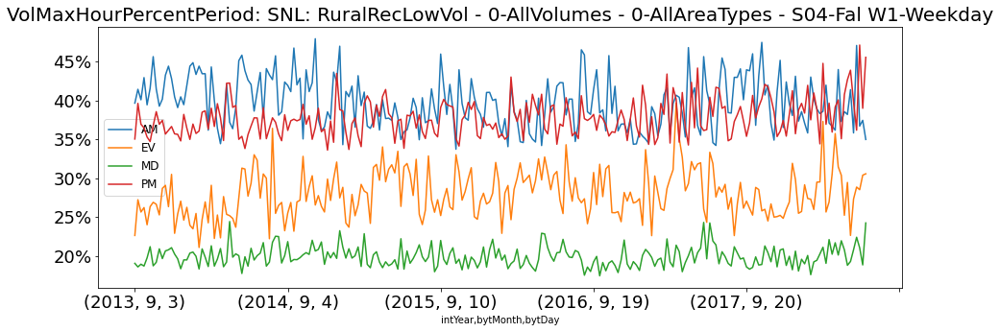

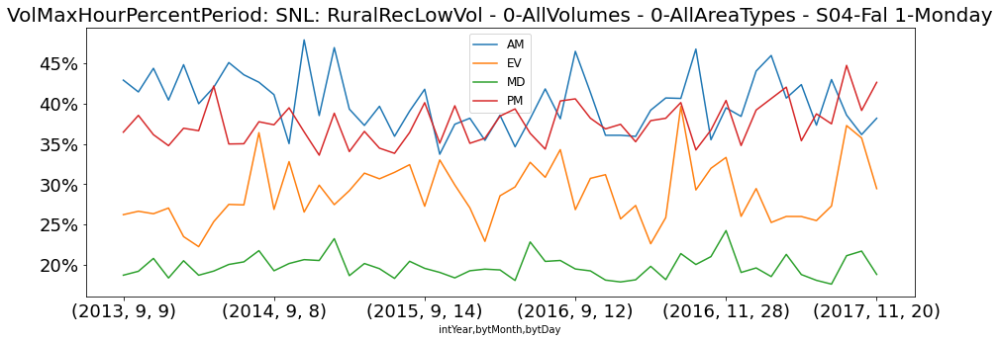

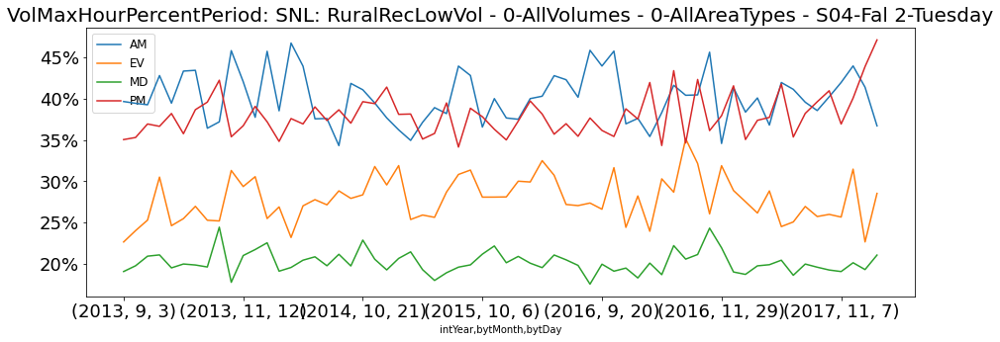

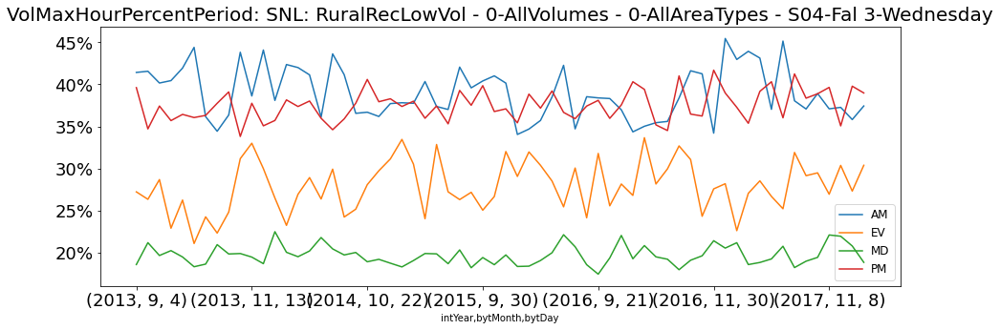

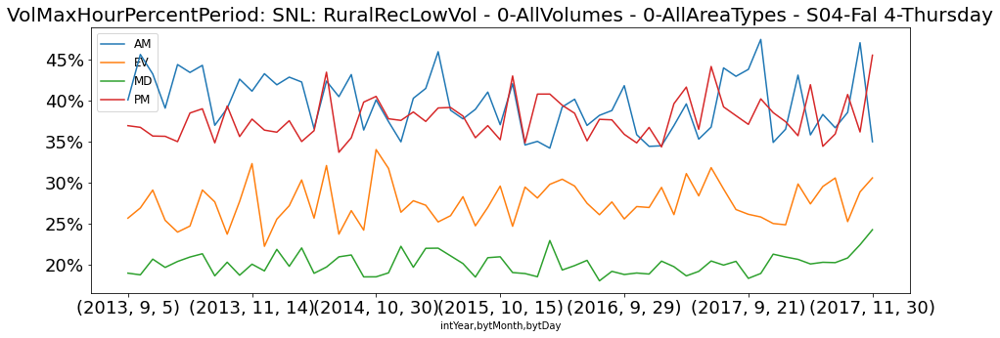

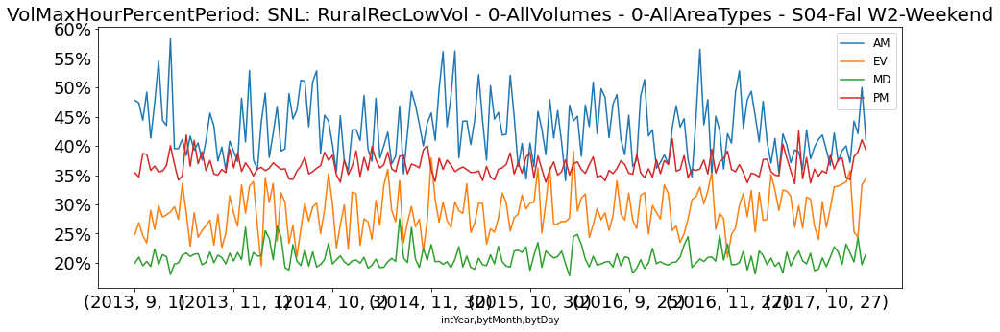

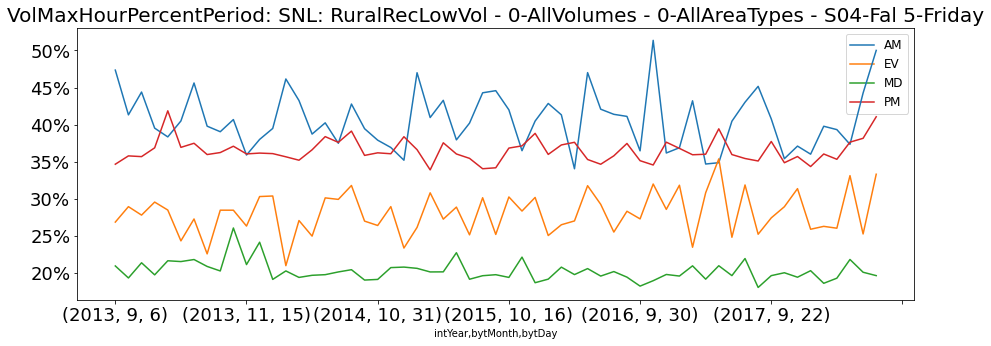

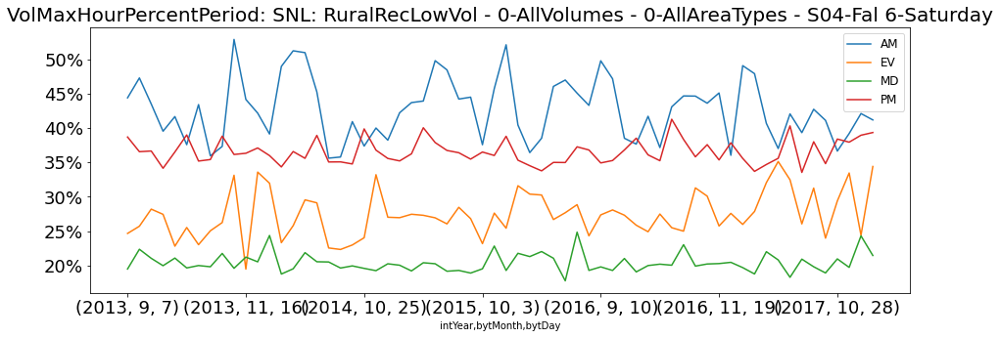

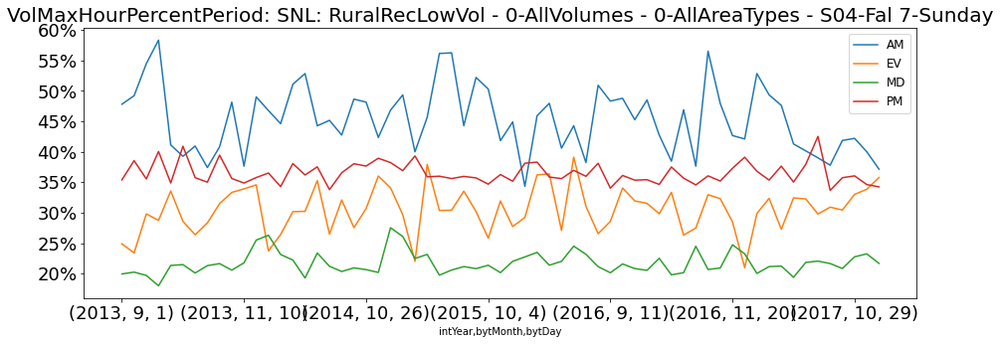

In [230]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W1-Weekday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','1-Monday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','2-Tuesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','3-Wednesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','4-Thursday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W2-Weekend','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','5-Friday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','6-Saturday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','7-Sunday','Period')

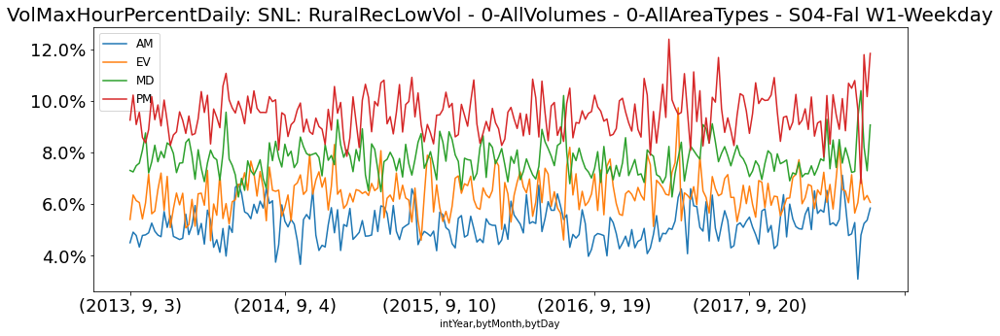

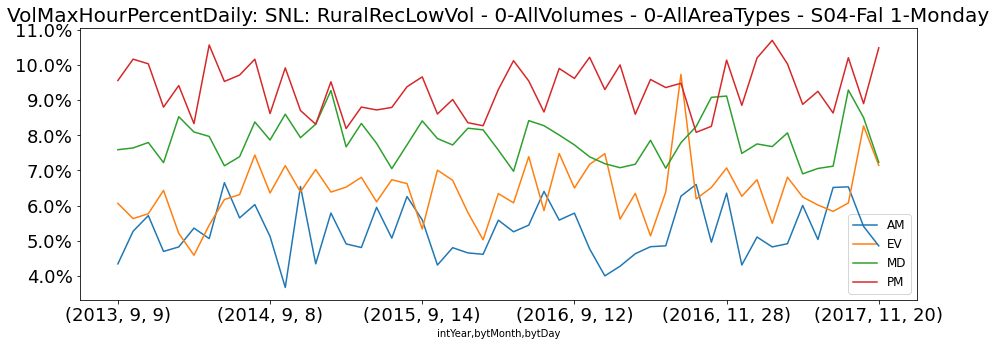

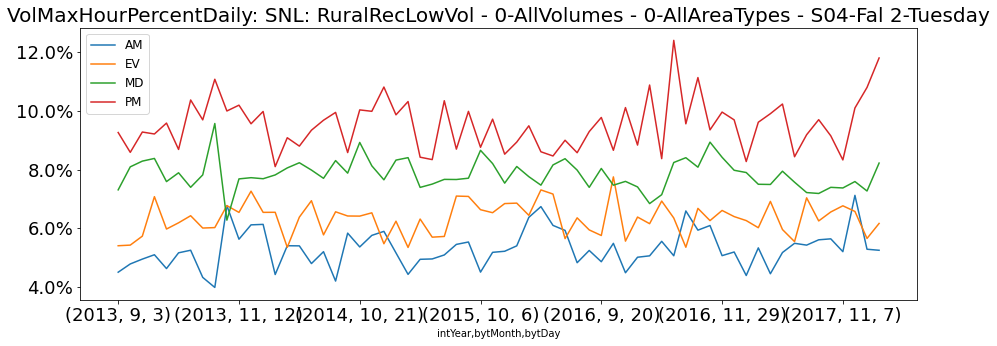

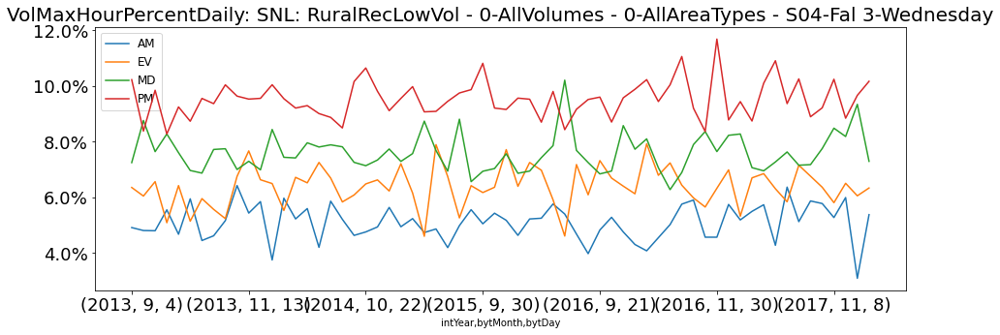

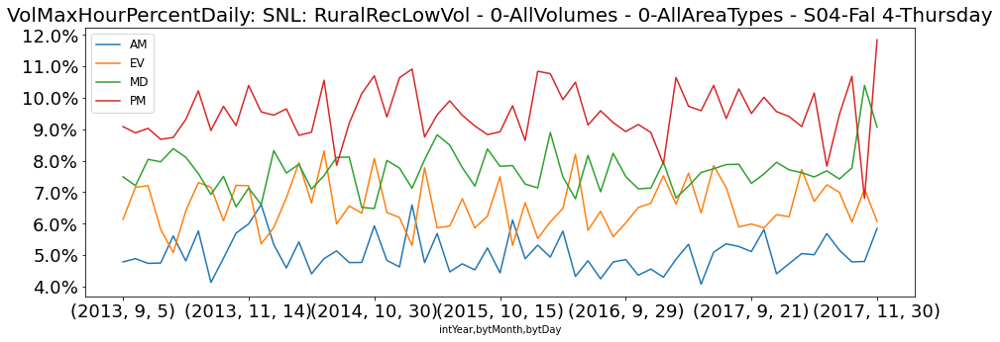

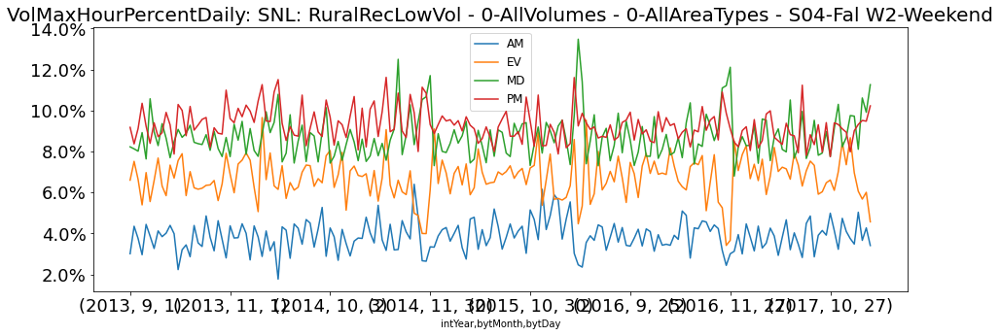

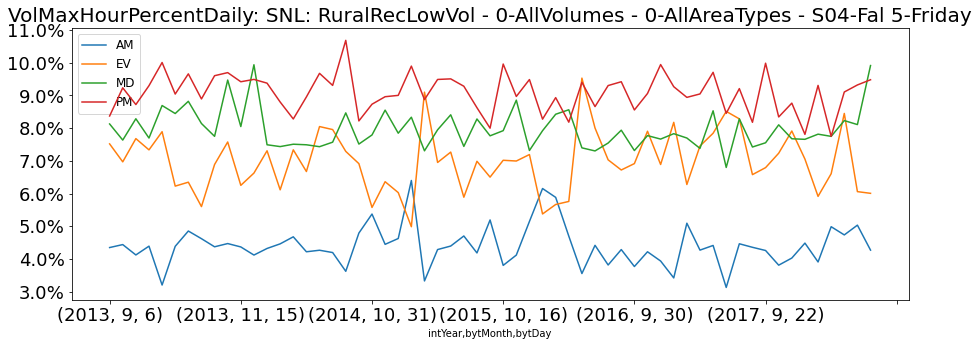

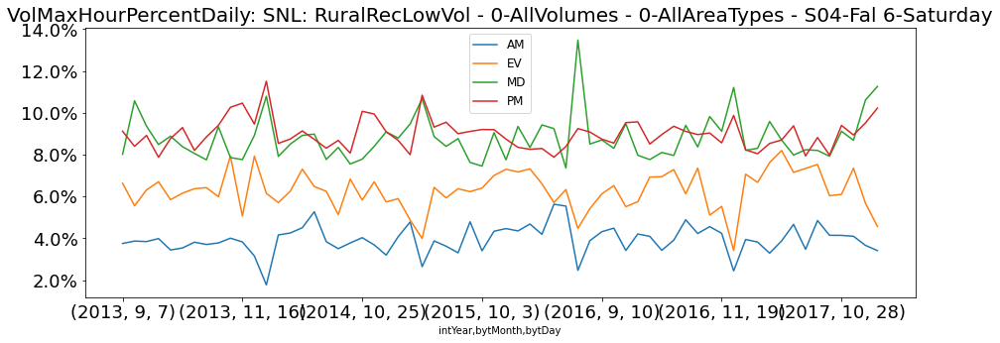

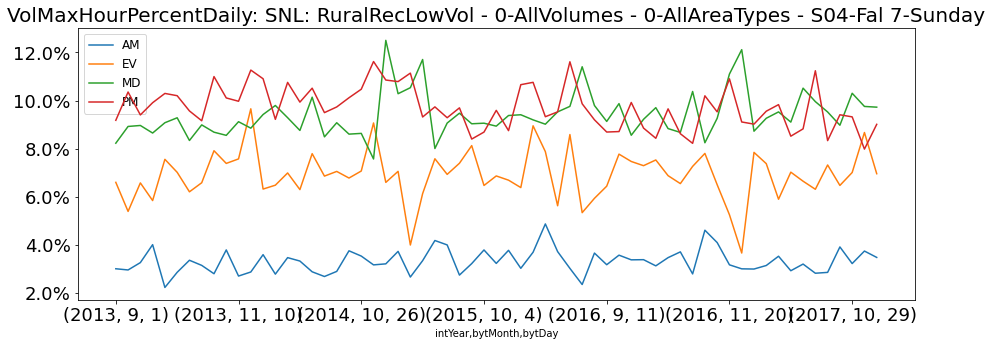

In [231]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W1-Weekday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','1-Monday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','2-Tuesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','3-Wednesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','4-Thursday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W2-Weekend','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','5-Friday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','6-Saturday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','7-Sunday','Daily')

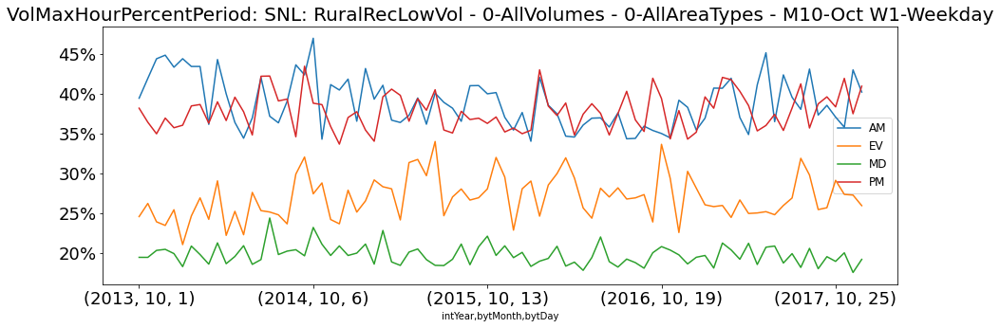

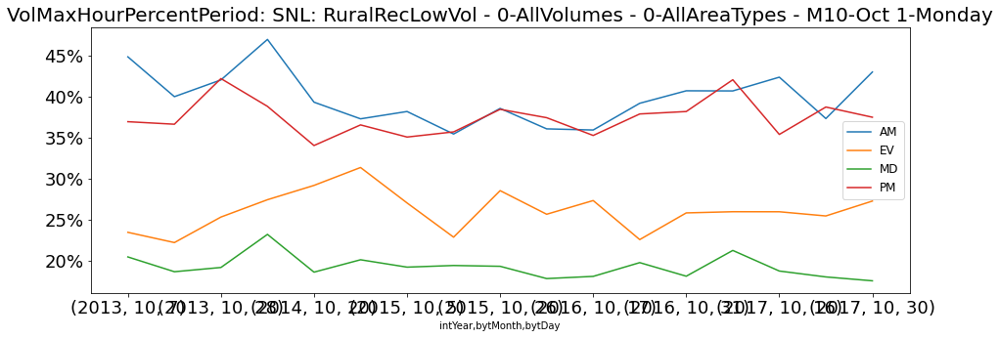

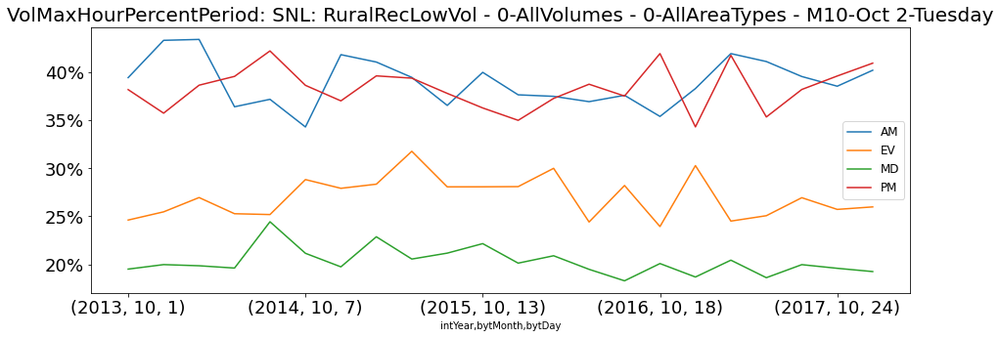

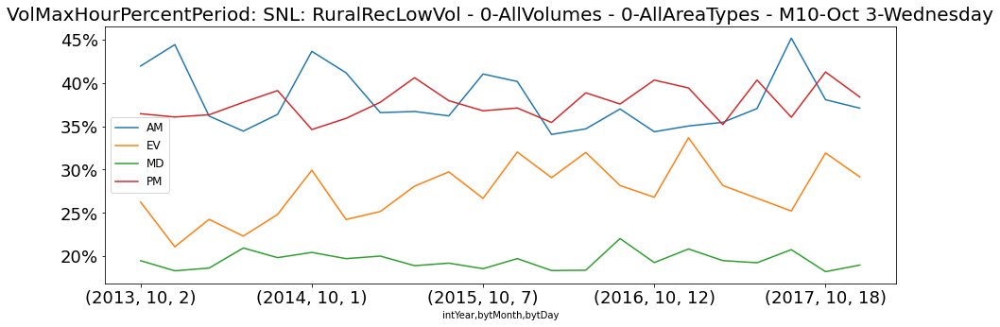

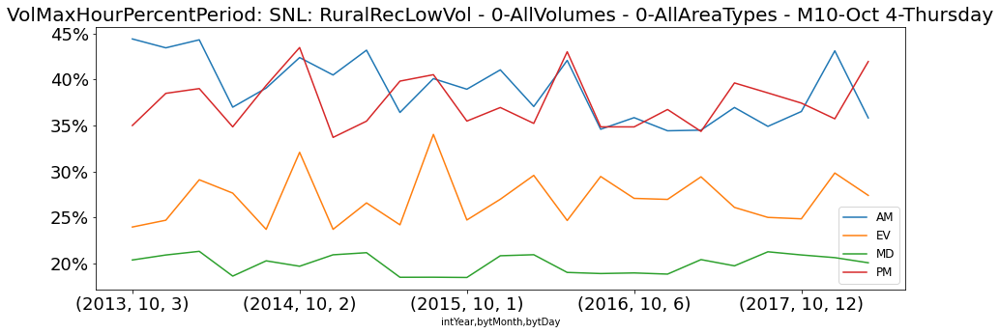

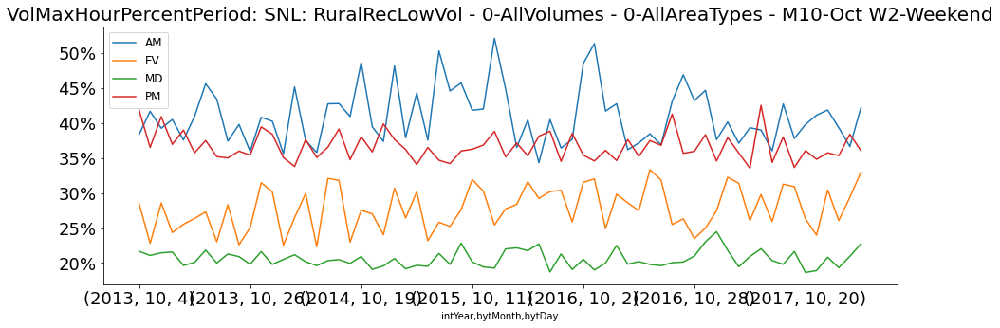

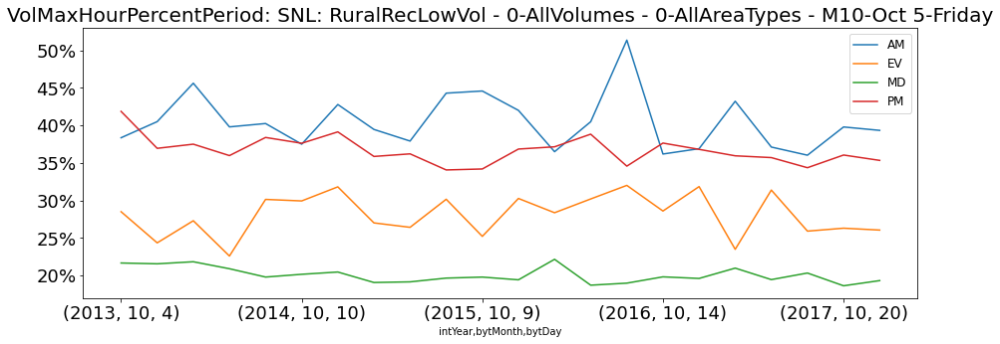

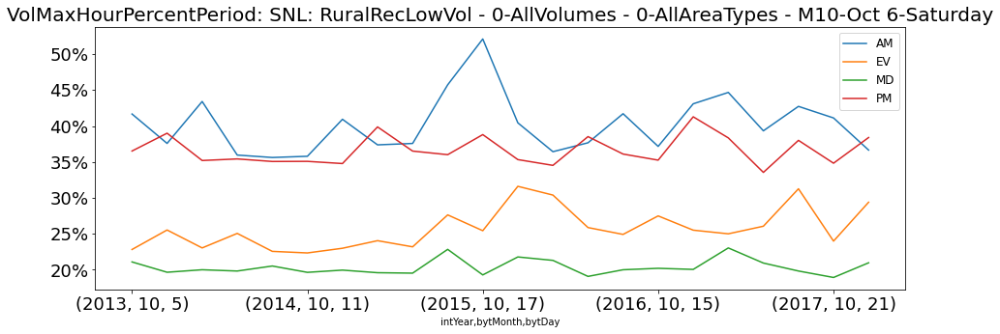

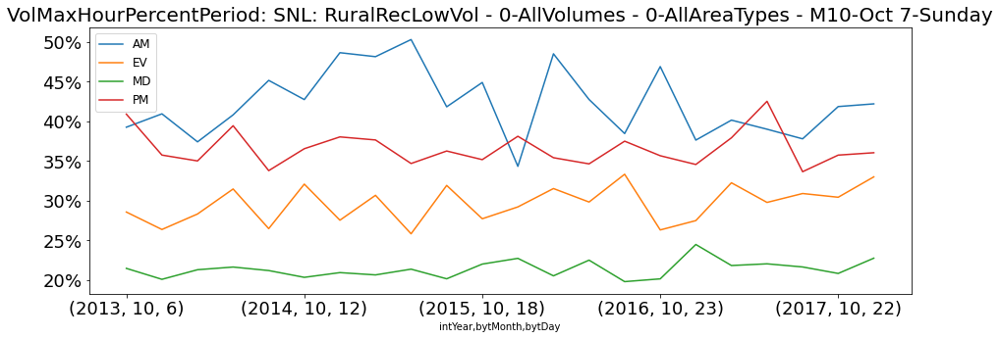

In [232]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W1-Weekday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','1-Monday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','2-Tuesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','3-Wednesday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','4-Thursday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W2-Weekend','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','5-Friday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','6-Saturday','Period')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','7-Sunday','Period')

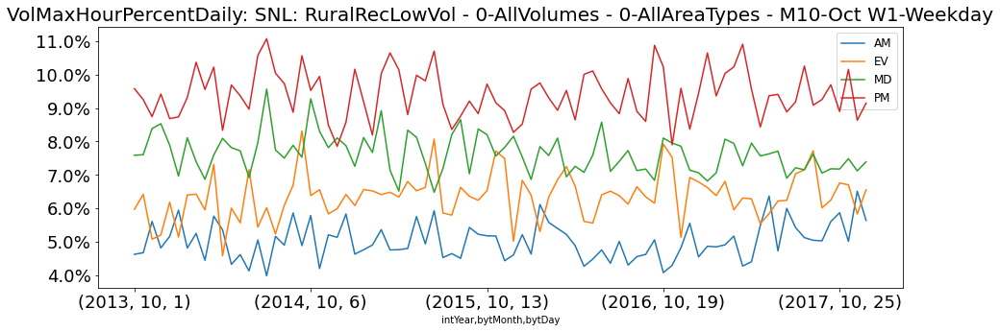

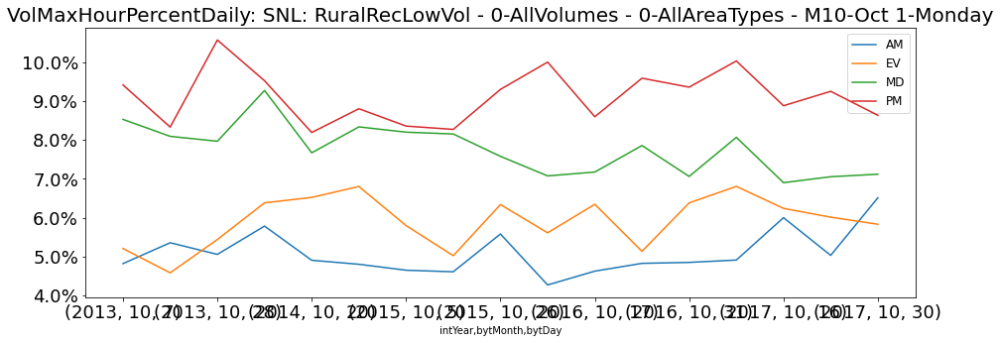

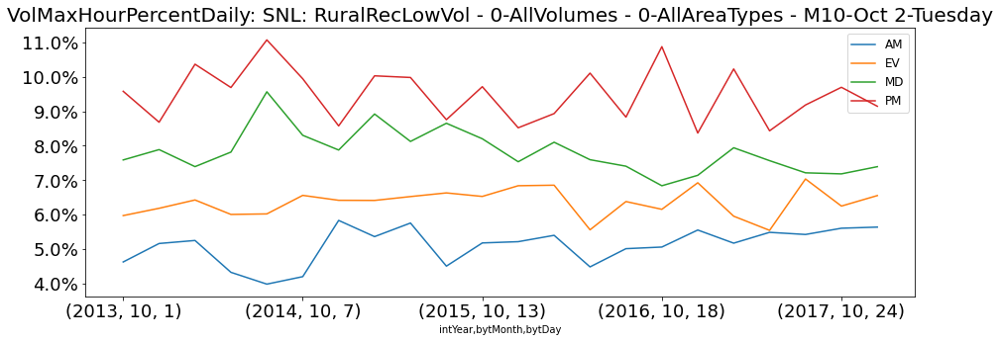

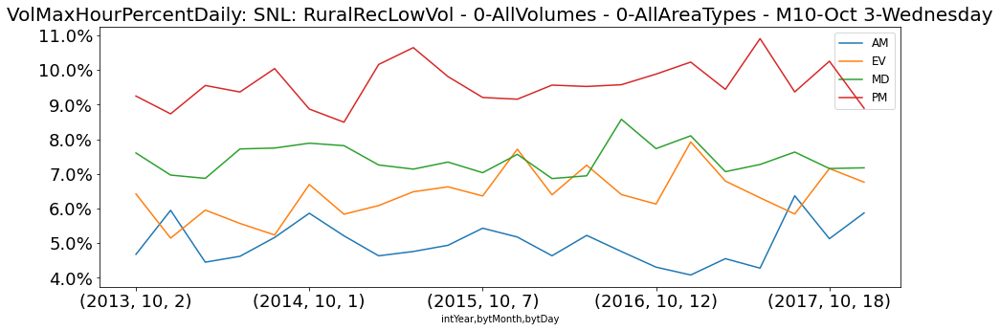

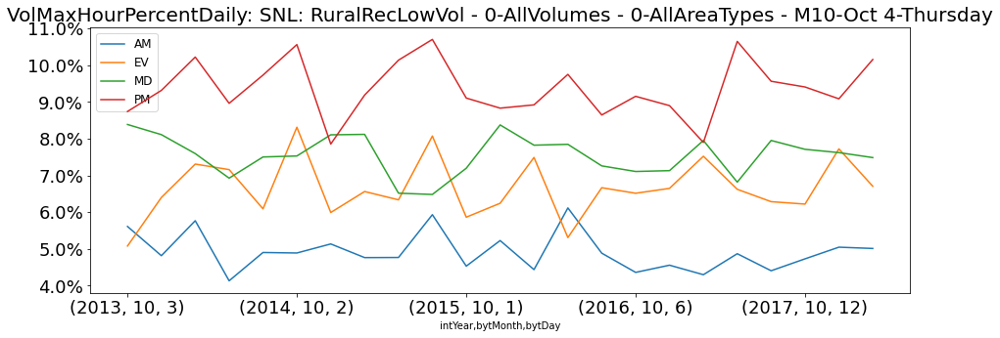

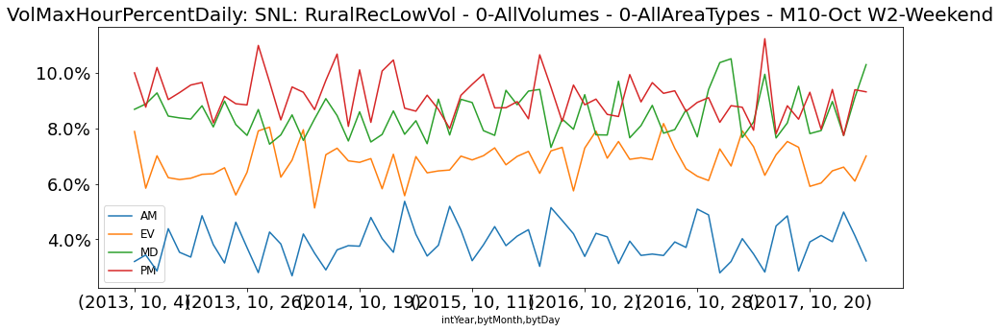

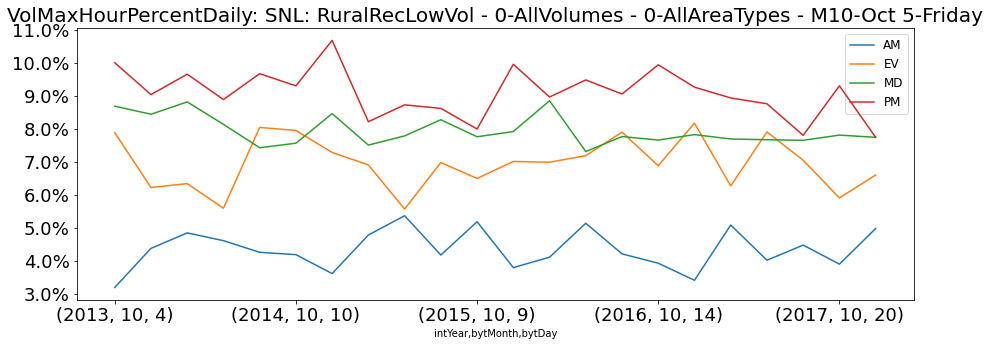

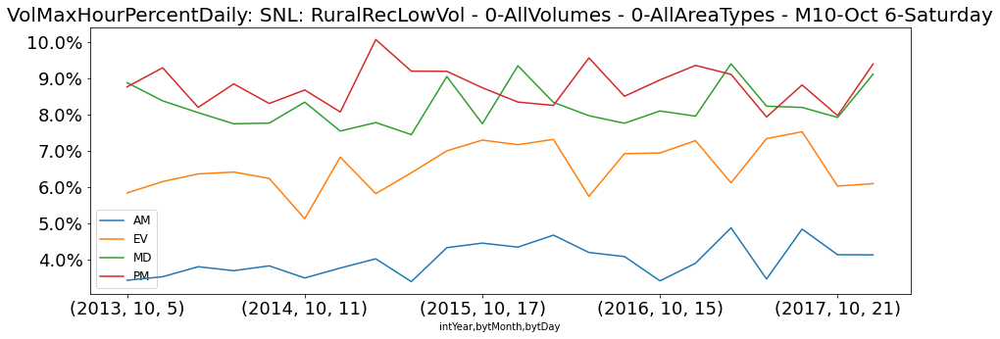

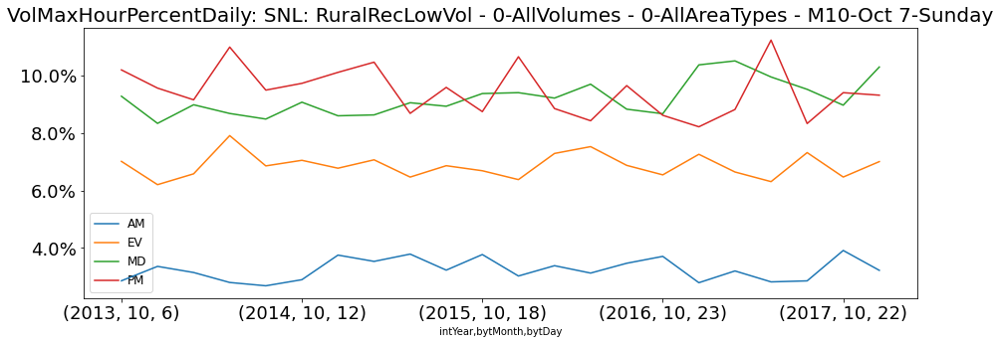

In [233]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W1-Weekday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','1-Monday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','2-Tuesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','3-Wednesday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','4-Thursday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W2-Weekend','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','5-Friday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','6-Saturday','Daily')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','7-Sunday','Daily')

In [234]:
df_PrdSiteGroupVol

,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Period,VolPeriodSum,VolMaxHourSum,numSites,VolMaxHourPercentPeriod
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333
1,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270
2,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762
3,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000
4,SN0,1-Monday,M01-Jan,2013,1,14,2,AM,25,14,2,0.560000
...,...,...,...,...,...,...,...,...,...,...,...,...
1335691,SNX,W2-Weekend,Year,2017,12,30,7,PM,28548,10302,3,0.360866
1335692,SNX,W2-Weekend,Year,2017,12,31,1,AM,6219,3187,3,0.512462
1335693,SNX,W2-Weekend,Year,2017,12,31,1,EV,21951,4738,3,0.215844
1335694,SNX,W2-Weekend,Year,2017,12,31,1,MD,38881,7518,3,0.193359


In [235]:
#AGGREGATE OVER TIME - PERIOD
df_PrdSiteGroupAgg = df_PrdSiteGroupVol.groupby(['SiteGroupSeason','SeasonGroup','DOWGroup','Period'], as_index=False).agg({'VolPeriodSum':[np.sum],'VolMaxHourSum':[np.sum]})
df_PrdSiteGroupAgg.columns = df_PrdSiteGroupAgg.columns.droplevel(1)

df_PrdSiteGroupAgg_ForJoining = df_PrdSiteGroupAgg.copy()
df_PrdSiteGroupAgg_ForJoining['HourPercentOf'] = 'Period'
df_PrdSiteGroupAgg_ForJoining['VolMaxHourPercent'] = df_PrdSiteGroupAgg_ForJoining['VolMaxHourSum'] / df_PrdSiteGroupAgg_ForJoining['VolPeriodSum']
df_PrdSiteGroupAgg_ForJoining = df_PrdSiteGroupAgg_ForJoining.drop(columns=['VolMaxHourSum','VolPeriodSum'])
display(df_PrdSiteGroupAgg_ForJoining)

#AGGREGATE OVER TIME - DAILY
df_DYSiteGroupAgg = df_DySiteGroupVol.groupby(['SiteGroupSeason','SeasonGroup','DOWGroup'], as_index=False).agg({'VolDailySum':[np.sum]})
df_DYSiteGroupAgg.columns = df_DYSiteGroupAgg.columns.droplevel(1)
df_DYSiteGroupAgg_ForJoining = pd.DataFrame.merge(df_DYSiteGroupAgg,df_PrdSiteGroupAgg,on=(['SiteGroupSeason','SeasonGroup','DOWGroup']))
df_DYSiteGroupAgg_ForJoining['HourPercentOf'] = 'Daily'
df_DYSiteGroupAgg_ForJoining['VolMaxHourPercent'] = df_DYSiteGroupAgg_ForJoining['VolMaxHourSum'] / df_DYSiteGroupAgg_ForJoining['VolDailySum']
df_DYSiteGroupAgg_ForJoining = df_DYSiteGroupAgg_ForJoining.drop(columns=['VolMaxHourSum','VolDailySum','VolPeriodSum'])
display(df_DYSiteGroupAgg_ForJoining)

#join
df_CCSVolMaxHourPercentByPeriod = pd.concat([df_PrdSiteGroupAgg_ForJoining,df_DYSiteGroupAgg_ForJoining])
display(df_CCSVolMaxHourPercentByPeriod)

,SiteGroupSeason,SeasonGroup,DOWGroup,Period,HourPercentOf,VolMaxHourPercent
0,SN0,M01-Jan,1-Monday,AM,Period,0.552833
1,SN0,M01-Jan,1-Monday,EV,Period,0.292623
2,SN0,M01-Jan,1-Monday,MD,Period,0.253412
3,SN0,M01-Jan,1-Monday,PM,Period,0.417949
4,SN0,M01-Jan,2-Tuesday,AM,Period,0.493776
...,...,...,...,...,...,...
19579,SNX,Year,W1-Weekday,PM,Period,0.344839
19580,SNX,Year,W2-Weekend,AM,Period,0.466340
19581,SNX,Year,W2-Weekend,EV,Period,0.214072
19582,SNX,Year,W2-Weekend,MD,Period,0.190017


,SiteGroupSeason,SeasonGroup,DOWGroup,Period,HourPercentOf,VolMaxHourPercent
0,SN0,M01-Jan,1-Monday,AM,Daily,0.045409
1,SN0,M01-Jan,1-Monday,EV,Daily,0.044906
2,SN0,M01-Jan,1-Monday,MD,Daily,0.119119
3,SN0,M01-Jan,1-Monday,PM,Daily,0.123019
4,SN0,M01-Jan,2-Tuesday,AM,Daily,0.036857
...,...,...,...,...,...,...
19579,SNX,Year,W1-Weekday,PM,Daily,0.077093
19580,SNX,Year,W2-Weekend,AM,Daily,0.040223
19581,SNX,Year,W2-Weekend,EV,Daily,0.060936
19582,SNX,Year,W2-Weekend,MD,Daily,0.077494


,SiteGroupSeason,SeasonGroup,DOWGroup,Period,HourPercentOf,VolMaxHourPercent
0,SN0,M01-Jan,1-Monday,AM,Period,0.552833
1,SN0,M01-Jan,1-Monday,EV,Period,0.292623
2,SN0,M01-Jan,1-Monday,MD,Period,0.253412
3,SN0,M01-Jan,1-Monday,PM,Period,0.417949
4,SN0,M01-Jan,2-Tuesday,AM,Period,0.493776
...,...,...,...,...,...,...
19579,SNX,Year,W1-Weekday,PM,Daily,0.077093
19580,SNX,Year,W2-Weekend,AM,Daily,0.040223
19581,SNX,Year,W2-Weekend,EV,Daily,0.060936
19582,SNX,Year,W2-Weekend,MD,Daily,0.077494


In [236]:
#export to csv in data-processed
df_CCSVolMaxHourPercentByPeriod.to_csv(os.path.join(dirResults, r'TODFactors.csv'),index=False)
display('Done exporting to csv')

'Done exporting to csv'